In [1]:
# Install torchaudio
!pip install torchaudio==0.9.1 -q
import librosa
import torchaudio
from torchaudio import transforms

     |████████████████████████████████| 1.9 MB 12.9 MB/s 
     |████████████████████████████████| 831.4 MB 6.9 kB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchvision 0.11.1+cu111 requires torch==1.10.0, but you have torch 1.9.1 which is incompatible.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.9.1 which is incompatible.


In [1]:
import datetime
import os

import torch
import torch.nn as nn
from torch.optim.lr_scheduler import ReduceLROnPlateau, ExponentialLR
from torch.utils.data import Dataset, DataLoader, IterableDataset

import numpy as np
import pandas as pd

from collections import Counter, defaultdict, OrderedDict

from sklearn.metrics import precision_score, f1_score, recall_score, classification_report, confusion_matrix, make_scorer, ConfusionMatrixDisplay
from sklearn.model_selection import StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import LabelEncoder

import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Consider ragas that have at least 10 samples.
RAGAM_MIN_COUNT = 10

In [4]:
data = pd.read_pickle('/content/drive/MyDrive/mp3_mfcc_normalized.pkl')

In [6]:
data = pd.read_json('/content/drive/MyDrive/song_lyric_map.json')
adata = pd.read_json('/content/drive/MyDrive/mp3_data_genres.json')

In [7]:
AUD_PATH = '/content/drive/MyDrive/Annamayya'
data['exists'] = data.apply(lambda x:os.path.exists(os.path.join(AUD_PATH,x['MP3 File'])),axis=1)
data = data[data.exists]

In [8]:
def get_offset(adata, id):
  l = adata[adata.Samputi==id]['Offset'].tolist()
  return 60 if len(l) == 0 else l[0]
data['Offset'] = data.apply(lambda x:get_offset(adata, x.Samputi), axis=1)

data['Offset'].fillna(60,inplace=True)

In [9]:
all_samples = data.Ragam.value_counts().index
low_samples = all_samples[data.Ragam.value_counts()<RAGAM_MIN_COUNT]
# Drop these rows.
for s in low_samples:
  data = data[data.Ragam!=s]

In [10]:
le = LabelEncoder()
le.fit_transform(data['Ragam'])
data['RagamCode'] = data.apply(lambda x:le.transform([x.Ragam])[0],axis=1)
n_labels = len(data['RagamCode'].unique())

In [11]:
data['Ragam'].value_counts()

లలిత            98
సాళంగనాట        94
సామంతం          89
బౌళి            70
శంకరాభరణం       68
శ్రీరాగం        65
రామక్రియ        61
ముఖారి          55
పాడి            49
ఆహిరి           45
దేసాళం          40
దేవగాంధారి      35
శుద్ధవసంతం      33
భూపాలం          32
దేసాక్షి        29
గుండుక్రియ      28
భైరవి           27
నాట             25
వరాళి           22
మలహరి           20
ధన్నాసి         20
కాంబోది         19
మాళవి           18
మాళవిగౌళ        18
కన్నడగౌళ        15
గుజ్జరి         15
గౌళ             14
బౌళిరామక్రియ    13
సాళంగం          11
నాదరామక్రియ     11
Name: Ragam, dtype: int64

In [12]:
print(f'Unique Ragas : {n_labels}')

Unique Ragas : 30


ఆహిరి : [0]
కన్నడగౌళ : [1]
కాంబోది : [2]
గుండుక్రియ : [3]
గుజ్జరి : [4]
గౌళ : [5]
దేవగాంధారి : [6]
దేసాక్షి : [7]
దేసాళం : [8]
ధన్నాసి : [9]
నాట : [10]
నాదరామక్రియ : [11]
పాడి : [12]
బౌళి : [13]
బౌళిరామక్రియ : [14]
భూపాలం : [15]
భైరవి : [16]
మలహరి : [17]
మాళవి : [18]
మాళవిగౌళ : [19]
ముఖారి : [20]
రామక్రియ : [21]
లలిత : [22]
వరాళి : [23]
శంకరాభరణం : [24]
శుద్ధవసంతం : [25]
శ్రీరాగం : [26]
సామంతం : [27]
సాళంగం : [28]
సాళంగనాట : [29]


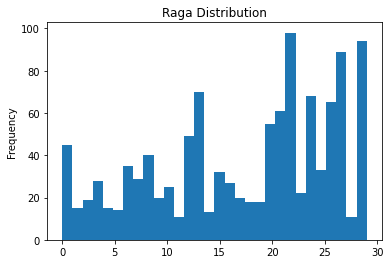

In [13]:
for c in le.classes_: print(f'{c} : {le.transform([c])}')
data['RagamCode'].plot.hist(bins=n_labels)
plt.title('Raga Distribution')
plt.show()

In [5]:
def get_devices():
    if torch.cuda.is_available():
        gpu = torch.device("cuda")
    else:
        gpu = torch.device("cpu")
    cpu = torch.device("cpu")
    return gpu, cpu
gpu, cpu = get_devices()

In [6]:
def get_loss_function(balance_classes, labels, run_on, loss_fcn=nn.CrossEntropyLoss):
    if balance_classes:
        class_wts = compute_class_weight(class_weight = 'balanced',
                                         classes = np.unique(labels),
                                         y = labels
                                         )
        print(f'Class Weights : {class_wts}')
        # convert class weights to tensor
        weights = torch.tensor(class_wts, dtype=torch.float)
        weights = weights.to(run_on)
        # loss function
        loss_fcn = loss_fcn(weight=weights)
    else:
        loss_fcn = loss_fcn()
    return loss_fcn

In [7]:
def update_best_result(best_scores, valid_loss, train_labels, train_predictions, test_labels, test_predictions,
                       model=None, model_file_name=f'saved_weights_Fold_0.pt'):
    if valid_loss < best_scores['valid_loss']:
        best_scores['valid_loss'] = valid_loss
        best_scores['train_predictions'] = train_predictions
        best_scores['test_predictions'] = test_predictions
        best_scores['train_labels'] = train_labels
        best_scores['test_labels'] = test_labels
        if model:
            torch.save(model.state_dict(), model_file_name)
    return best_scores

In [8]:
def update_results_dict(results, train_labels, train_predictions, test_labels, test_predictions, s='micro'):
    results['train_precision'].append(precision_score(train_labels, train_predictions,average=s))
    results['train_recall'].append(recall_score(train_labels, train_predictions,average=s))
    results['train_f1'].append(f1_score(train_labels, train_predictions,average=s))
    results['validation_precision'].append(precision_score(test_labels, test_predictions,average=s))
    results['validation_recall'].append(recall_score(test_labels, test_predictions,average=s))
    results['validation_f1'].append(f1_score(test_labels, test_predictions,average=s))
    return results

In [9]:
def run_model(model, dataset, loss_fcn, optimizer, is_training, run_on, clip_at=None, lstm_model=False, report_at=20):
  predict = lambda model, data, hidden: model(data, hidden) if hidden else model(data)
  hid = lambda model, data, run_on, lstm_model: model.init_hidden(data.shape[0], run_on) if lstm_model else None
  if is_training:
      model.train()
  else:
      model.eval()
  total_loss, total_accuracy, model_predictions, model_labels, aud_data = 0, 0, [], [], None
  for step, batch in enumerate(dataset):
      if step % report_at == 0 and not step == 0:
          print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(dataset)))
      # push the batch to gpu
      batch = [r.to(run_on) for r in batch]        
      aud_data, labels = batch
      h = hid(model, aud_data, run_on, lstm_model)
      if is_training:
          for o in optimizer: o.zero_grad()
          model.zero_grad()
          predictions = predict(model, aud_data, h)
      else:
          with torch.no_grad():
            predictions = predict(model, aud_data, h)
      # compute the loss between actual and predicted values
      loss = loss_fcn(predictions, labels)
      predictions = predictions.detach().cpu().numpy()
      total_loss = total_loss + loss.item()
      if is_training:
          loss.backward()  # backward pass to calculate the gradients
          if clip_at: torch.nn.utils.clip_grad_norm_(model.parameters(), clip_at)
          # update parameters
          for o in optimizer: o.step()
      # append the model predictions
      model_predictions.append(predictions)
      model_labels.append(labels.detach().cpu().numpy())
      del batch
  # compute the training loss of the epoch
  avg_loss = total_loss / len(dataset)
  # predictions are in the form of (no. of batches, size of batch, no. of classes).
  # reshape the predictions in form of (number of samples, no. of classes)
  model_predictions = np.concatenate(model_predictions, axis=0)
  model_labels = np.concatenate(model_labels, axis=0)
  # returns the loss and predictions
  model_predictions = np.argmax(model_predictions, axis=1)
  return avg_loss, model_predictions, model_labels, model

In [10]:
def plot_results(results, model_name):
    fig = plt.figure(figsize=[20, 10])
    epochs = len(results[0]['train_precision'])
    x_label = f'{len(results)} Fold and {epochs} Epochs'
    legend_labels = ['Train', 'Val']

    def subplot_routine(key1, key2, title, loss=False):
        plt.plot([x for k in results for x in results[k][key1]])
        plt.plot([x for k in results for x in results[k][key2]])
        plt.grid()
        plt.xlabel(x_label)
        plt.legend([f'{x} {title}' for x in legend_labels])
        if not loss:
            plt.ylim([0, 1.1])
        else:
            b, t = plt.ylim()
            plt.ylim(np.floor(b), np.ceil(t))

    gs = GridSpec(2, 3, figure=fig)
    plt.subplot(gs.new_subplotspec((0, 0), colspan=3))
    subplot_routine('train_losses', 'validation_losses', 'Losses', True)
    plt.subplot(2, 3, 4)
    subplot_routine('train_precision', 'validation_precision', 'Precision')
    plt.subplot(2, 3, 5)
    subplot_routine('train_recall', 'validation_recall', 'Recall')
    plt.subplot(2, 3, 6)
    subplot_routine('train_f1', 'validation_f1', 'F1')
    plt.suptitle(f'Metrics for {model_name}')
    plt.tight_layout()
    plt.show()

In [11]:
class AbsDataset(IterableDataset):
  def __init__(self):
    super().__init__()
  
  def get_data_loader(self, batch_size=32, random_seed=42):
    g = torch.Generator()
    g.manual_seed(random_seed)
    return DataLoader(self, batch_size=batch_size, generator=g)

In [14]:
def train_model(data, prepare_data_hnd, gpu, **kwargs):
  torch.manual_seed(42)
  start_time = datetime.datetime.now()

  n_labels = kwargs['n_labels']
  title = kwargs['title']
  report = kwargs['report'] if 'report' in kwargs else 20
  lstm = kwargs['lstm'] if 'lstm' in kwargs else False
  lr = kwargs['lr'] if 'lr' in kwargs else 1e-4
  clip_at = kwargs['clip_at'] if 'clip_at' in kwargs else None
  k_folds = kwargs['k_folds'] if 'k_folds' in kwargs else 5
  balance_classes = kwargs['balance_classes'] if 'balance_classes' in kwargs else True
  dropout = kwargs['dropout'] if 'dropout' in kwargs else 0.25
  plot = kwargs['plot'] if 'plot' in kwargs else True
  epochs = kwargs['epochs'] if 'epochs' in kwargs else 5
  mdlargs = kwargs['mdlargs'] if 'mdlargs' in kwargs else {}
  feature = kwargs['feature'] if 'feature' in kwargs else ['mfcc_mean']
  target = kwargs['target'] if 'target' in kwargs else 'RagamCode'
  
  k_fold = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=42)
  results = {x: {} for x in range(k_folds)}
  labels = data[target]
  ovl_best_scores = {'valid_loss': float('inf'),
                    'train_predictions': [],
                    'test_predictions': [],
                    'train_labels': [],
                    'test_labels': []
                    }
  for fold, (train_ids, test_ids) in enumerate(k_fold.split(data[feature], data[target])):
    print(f'FOLD {fold + 1} \n Data Sizes (Train/Test) : {len(train_ids)}/{len(test_ids)}')
    fold_start = datetime.datetime.now()
    # empty lists to store training and validation loss of each epoch
    train_losses, valid_losses = [], []
    best_scores = {'valid_loss': float('inf'),
                    'train_predictions': [],
                    'test_predictions': [],
                    'train_labels': [],
                    'test_labels': []
                    }
    # for each epoch
    results[fold] = {
        'train_f1': [],
        'validation_f1': [],
        'train_precision': [],
        'validation_precision': [],
        'train_recall': [],
        'validation_recall': []
    }
    train_data, test_data, train_lbls, test_lbls = prepare_data_hnd(data, train_ids, test_ids)
    model = kwargs['model'](n_labels,dropout=dropout,**mdlargs)
    model.to(gpu)
    loss_fcn = get_loss_function(balance_classes, data[target].tolist(), gpu, nn.CrossEntropyLoss)
    # define the optimizer
    optimizer = [torch.optim.Adam(model.parameters(), lr=lr)]
    lr_schedulers = [ReduceLROnPlateau(optimizer[0], patience=3,factor=0.1,threshold=1e-9,mode='min'),
                     ExponentialLR(optimizer[0],gamma=0.9)]
    for epoch in range(epochs):
        e_start = datetime.datetime.now()
        # train model
        train_loss, train_predictions, train_labels, model = run_model(model, train_data.get_data_loader(batch_size=64),
                                                                        loss_fcn, optimizer, run_on=gpu,
                                                                        is_training=True, clip_at=clip_at,
                                                                       lstm_model=lstm, report_at=report)
        # evaluate model
        valid_loss, test_predictions, test_labels, model = run_model(model, test_data.get_data_loader(batch_size=64),
                                                                      loss_fcn, optimizer, run_on=gpu,
                                                                      is_training=False, clip_at=clip_at,
                                                                     lstm_model=lstm, report_at=report)
        for lr_scheduler in lr_schedulers:
            lr_scheduler.step(valid_loss)
        torch.cuda.empty_cache()
        # save the best model
        best_scores = update_best_result(best_scores,
                                          valid_loss,
                                          train_labels, train_predictions,
                                          test_labels, test_predictions,
                                          model=model,
                                          model_file_name=f'saved_weights_Fold_{fold}.pt')
        ovl_best_scores = update_best_result(ovl_best_scores,
                                          valid_loss,
                                          train_labels, train_predictions,
                                          test_labels, test_predictions)
        # append training and validation loss
        train_losses.append(train_loss)
        valid_losses.append(valid_loss)
        results[fold] = update_results_dict(results[fold],
                                            train_labels, train_predictions,
                                            test_labels, test_predictions)
        e_end = datetime.datetime.now()
        print(f'Epoch {epoch+1}/{epochs} : Training Loss: {train_loss:.3f} / Validation Loss : {valid_loss:.3f} [Time Taken : {(e_end - e_start).total_seconds()} seconds]')
        print(confusion_matrix(train_labels, train_predictions))
        print(confusion_matrix(test_labels,test_predictions))
    del model
    print('*** Confusion Matrix - Training ***')
    print(confusion_matrix(best_scores['train_labels'],best_scores['train_predictions']))
    print('*** Confusion Matrix - Validation ***')
    print(confusion_matrix(best_scores['test_labels'],best_scores['test_predictions']))
    results[fold]['train_losses'] = train_losses
    results[fold]['validation_losses'] = valid_losses
    print(f'Fold {fold+1} : {(datetime.datetime.now() - fold_start).total_seconds()} seconds')
  end_time = datetime.datetime.now()
  print(f'Overall Time : {(end_time - start_time).total_seconds()} seconds')
  print('*** Confusion Matrix - Training ***')
  print(confusion_matrix(ovl_best_scores['train_labels'],ovl_best_scores['train_predictions']))
  print('*** Confusion Matrix - Validation ***')
  print(confusion_matrix(ovl_best_scores['test_labels'],ovl_best_scores['test_predictions']))
  if plot: plot_results(results, title)
  return results

In [13]:
def results_to_df(results):
    p = pd.DataFrame(results[0])
    for i in range(1, len(results)):
        p = pd.concat([p, pd.DataFrame(results[i])], axis=0)
    p.sort_values(by='validation_f1', ascending=False, inplace=True)
    return p

# OVR Experiment 1 - MFCC Feed Forward

In [24]:
FREQ = 16000
DURATION = 120
mfcc_tx = transforms.MFCC(FREQ, n_mfcc=40, melkwargs={'n_fft':512,'normalized':True,'f_min':20,'f_max':4000})
def get_mfcc(x, aud_path, mfcc_tx):
  aud_path = os.path.join(aud_path, x['MP3 File'])
  i = torchaudio.info(aud_path)
  waveform, sample_rate = torchaudio.load(aud_path, 
                                          frame_offset=int(x['Offset']*i.sample_rate), 
                                          num_frames= DURATION*i.sample_rate)
  waveform = librosa.to_mono(waveform)
  resampler = transforms.Resample(sample_rate, FREQ)
  if len(waveform) > 0 :
    waveform = resampler(torch.tensor(waveform))
    mfcc = mfcc_tx(waveform)
  else:
    mfcc = []
  return mfcc
data['mfcc'] = data.apply(lambda x:get_mfcc(x, AUD_PATH, mfcc_tx),axis=1)
data = data[data.apply(lambda x:not isinstance(x['mfcc'],list),axis=1)]

In [25]:
data.to_pickle('/content/drive/MyDrive/mp3_mfcc_normalized.pkl')

In [15]:
class MfccMatrixDataset(AbsDataset):
    def __init__(self, labels, mfcc_vals):
        super().__init__()
        self.labels = labels
        self.mfcc_vals = mfcc_vals

    def __get__(self,index):
      if self.mfcc_vals[index].shape[1] < 7501:
        self.mfcc_vals[index] = torch.hstack((self.mfcc_vals[index],torch.zeros(40,7501-self.mfcc_vals[index].shape[1])))
      
      return self.mfcc_vals[index].reshape((1,)+self.mfcc_vals[index].shape)

    def __len__(self):
        return len(self.labels)

    def __iter__(self):
        for index, _ in enumerate(self.labels):
            yield self.__get__(index), self.labels[index]

    def __getitem__(self, index):
        return self.__get__(index), self.labels[index]

    @staticmethod
    def prepare_data(data, train_ids, test_ids):
      train_lbls = torch.tensor([data['RagamCode'].iloc[x] for x in train_ids])
      test_lbls = torch.tensor([data['RagamCode'].iloc[x] for x in test_ids])
      train_vals = [data['mfcc'].iloc[x] for x in train_ids]
      test_vals = [data['mfcc'].iloc[x] for x in test_ids]
      train_data = MfccMatrixDataset(train_lbls, train_vals)
      test_data = MfccMatrixDataset(test_lbls, test_vals)
      return train_data, test_data, train_lbls, test_lbls

In [19]:
class MfccRaga(nn.Module):
    def __init__(self, n_labels, dropout=0.25):
        super().__init__()
        self.height = 40
        self.width = 7501
        # Fully connected audio layer with MFCC Matrix 40x7501 (120secs)
        pool_kernel = 10
        kernel = (2,2)
        self.layers1 = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=8, kernel_size=kernel, padding='same'),            
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=pool_kernel),
            nn.Dropout(dropout),
            nn.Flatten()
        )
        self.final = nn.Sequential(nn.Linear(24000,1000),
                                   nn.ReLU(),
                                   nn.Linear(1000,2))
        
    def forward(self,x):
        x = self.layers1(x)
        x = self.final(x)
        return x

In [17]:
def ovr_train_model(data, dataset, mdl, title, labels, label_classes, lbl_encoder=None, target='RagamCode', feature='mfcc', lr=5e-3,
                    lstm=False, dropout=0.1, epochs=15, n_folds=2):
  results = {}
  for i in labels:
    # Create new data    
    nsamples = data[data[target]==i].shape[0]
    if lbl_encoder: 
      lbl = lbl_encoder.inverse_transform([i])
      print(f'Training for {lbl} with {nsamples} positive samples')
    else:
      lbl = i
    ndata = pd.DataFrame()
    ndata[target] = data.apply(lambda x:1 if x[target] == i else 0, axis=1)
    ndata[feature] = data[feature]
    results[i] = train_model(ndata, dataset.prepare_data, gpu, 
                                  **{'n_labels' : 2,
                                   'report' : 50,
                                   'lstm' : lstm,
                                   'lr' : lr,
                                   'clip_at' : None,
                                   'k_folds' : n_folds,
                                   'balance_classes' : True,
                                   'dropout' : dropout,
                                   'title' : title,
                                   'plot' : True,
                                   'epochs' : epochs,
                                   'model' : mdl,
                                   'feature' : feature,
                                   'target' : target})
    print(results_to_df(results[i]))
  return results

Training for ['ఆహిరి'] with 45 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.52056673 12.65555556]
Epoch 1/15 : Training Loss: 1.259 / Validation Loss : 0.868 [Time Taken : 2.073092 seconds]
[[400 475]
 [ 15  21]]
[[163  56]
 [  8   1]]
Epoch 2/15 : Training Loss: 0.944 / Validation Loss : 0.820 [Time Taken : 2.128066 seconds]
[[741 134]
 [ 29   7]]
[[107 112]
 [  7   2]]
Epoch 3/15 : Training Loss: 0.825 / Validation Loss : 0.805 [Time Taken : 2.118551 seconds]
[[577 298]
 [ 26  10]]
[[109 110]
 [  7   2]]
Epoch 4/15 : Training Loss: 0.790 / Validation Loss : 0.794 [Time Taken : 2.088265 seconds]
[[628 247]
 [ 23  13]]
[[136  83]
 [  7   2]]
Epoch 5/15 : Training Loss: 0.778 / Validation Loss : 0.785 [Time Taken : 2.102625 seconds]
[[690 185]
 [ 24  12]]
[[ 97 122]
 [  5   4]]
Epoch 6/15 : Training Loss: 0.760 / Validation Loss : 0.782 [Time Taken : 2.13138 seconds]
[[653 222]
 [ 28   8]]
[[108 111]
 [  5   4]]
Epoch 7/15 : Training Loss: 0.685 / Vali

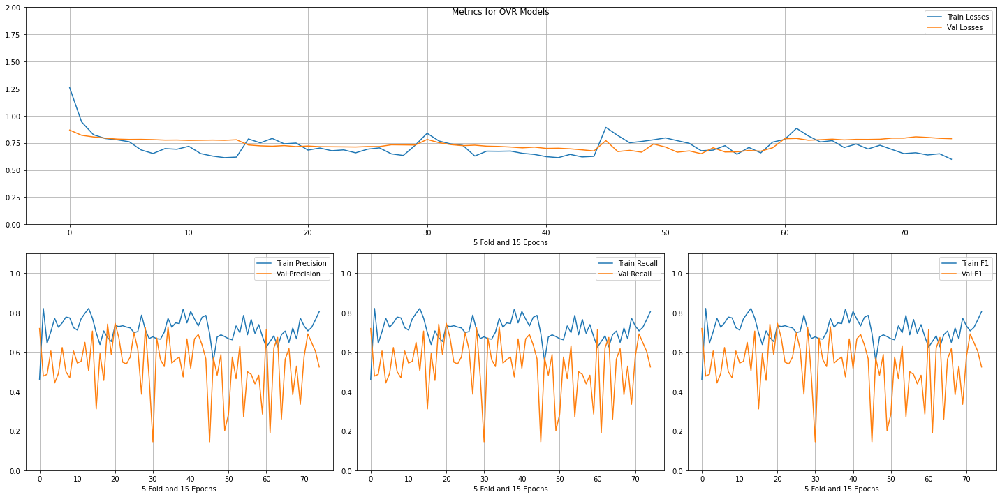

    train_f1  validation_f1  ...  train_losses  validation_losses
5   0.734358       0.745614  ...      0.683153           0.720682
3   0.672887       0.741228  ...      0.741006           0.724622
4   0.770582       0.728070  ...      0.628416           0.728709
13  0.712404       0.723684  ...      0.633655           0.731252
0   0.462130       0.719298  ...      1.259337           0.868088
..       ...            ...  ...           ...                ...
4   0.687500       0.259912  ...      0.770595           0.784406
4   0.678375       0.201754  ...      0.778376           0.739188
1   0.653509       0.189427  ...      0.883830           0.791269
0   0.677278       0.144737  ...      0.838435           0.781352
0   0.694841       0.144737  ...      0.892595           0.770602

[75 rows x 8 columns]
Training for ['కన్నడగౌళ'] with 15 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.5066726  37.96666667]
Epoch 1/15 : Training Loss: 1.025 / Validation Lo

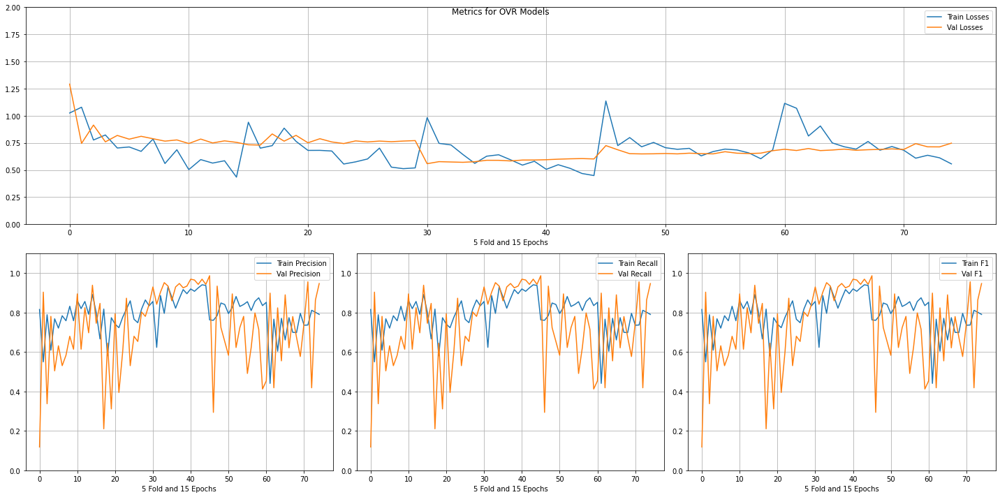

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.762898       0.986842  ...      1.136084           0.724650
13  0.940724       0.969298  ...      0.467567           0.605076
10  0.919868       0.969298  ...      0.505968           0.594586
11  0.907794       0.964912  ...      0.548479           0.599408
11  0.736842       0.955947  ...      0.608654           0.742715
..       ...            ...  ...           ...                ...
2   0.789243       0.337719  ...      0.776104           0.914107
4   0.773875       0.311404  ...      0.763861           0.818943
1   0.760703       0.293860  ...      0.724755           0.686161
2   0.817783       0.210526  ...      0.724221           0.832061
0   0.815587       0.118421  ...      1.025247           1.291735

[75 rows x 8 columns]
Training for ['కాంబోది'] with 19 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.50848214 29.97368421]
Epoch 1/15 : Training Loss: 0.991 / Validation Los

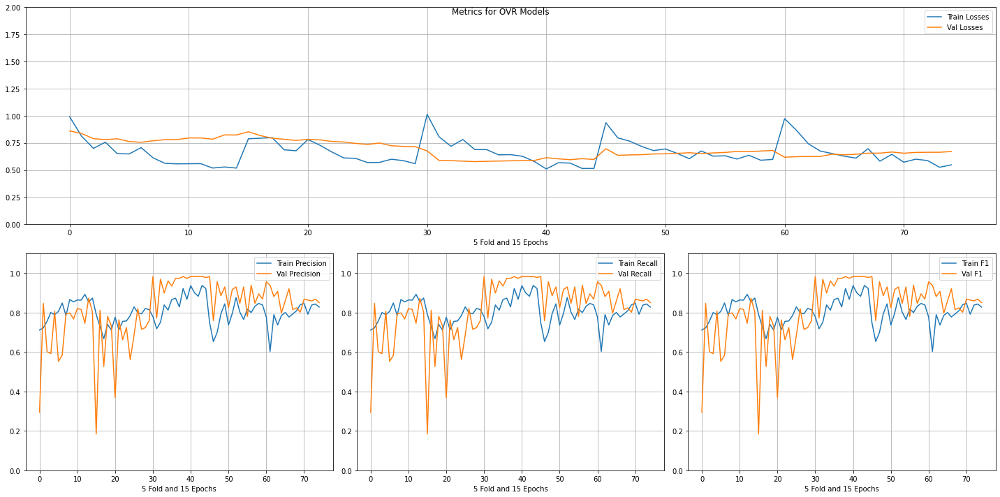

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.748628       0.982456  ...      0.935939           0.695569
0   0.779363       0.982456  ...      1.012307           0.675405
8   0.922064       0.982456  ...      0.626565           0.586745
10  0.936334       0.982456  ...      0.509263           0.613470
11  0.900110       0.982456  ...      0.566590           0.602887
..       ...            ...  ...           ...                ...
5   0.805708       0.552632  ...      0.647907           0.762233
2   0.667398       0.526316  ...      0.797952           0.792544
5   0.776070       0.368421  ...      0.780445           0.781801
0   0.711306       0.293860  ...      0.990738           0.859617
0   0.790340       0.184211  ...      0.787510           0.852139

[75 rows x 8 columns]
Training for ['గుండుక్రియ'] with 28 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.51260126 20.33928571]
Epoch 1/15 : Training Loss: 1.221 / Validation 

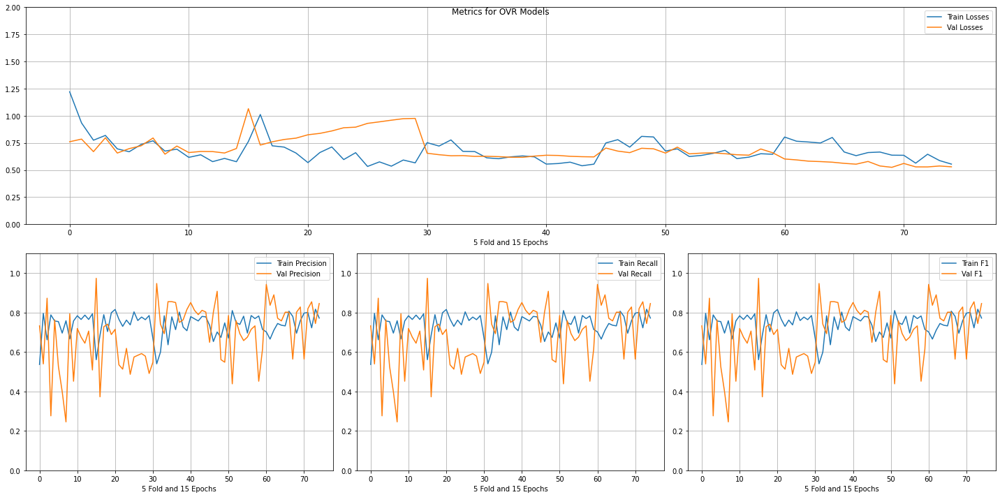

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.560922       0.973684  ...      0.762401           1.065007
1   0.540066       0.947368  ...      0.720511           0.640757
0   0.701754       0.942731  ...      0.803496           0.601262
2   0.701427       0.907895  ...      0.710398           0.659814
2   0.710526       0.889868  ...      0.757970           0.581314
..       ...            ...  ...           ...                ...
6   0.810099       0.438596  ...      0.694592           0.710532
6   0.695939       0.399123  ...      0.735120           0.723028
1   0.684962       0.372807  ...      1.011370           0.729469
3   0.788145       0.276316  ...      0.818615           0.796760
7   0.758507       0.245614  ...      0.768695           0.794902

[75 rows x 8 columns]
Training for ['గుజ్జరి'] with 15 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.5066726  37.96666667]
Epoch 1/15 : Training Loss: 1.198 / Validation Los

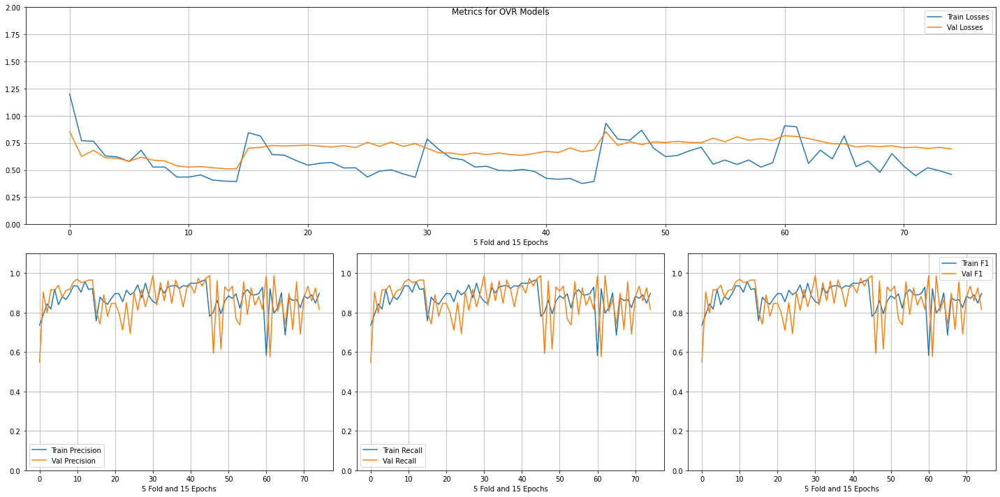

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.856202       0.986842  ...      0.786504           0.699538
0   0.780461       0.986842  ...      0.931345           0.852813
2   0.797149       0.986784  ...      0.559666           0.790989
0   0.582237       0.986784  ...      0.907429           0.816524
12  0.950604       0.973684  ...      0.421569           0.702425
..       ...            ...  ...           ...                ...
9   0.824561       0.691630  ...      0.650536           0.723316
3   0.793633       0.614035  ...      0.866149           0.734082
1   0.802415       0.592105  ...      0.784421           0.725652
1   0.921053       0.577093  ...      0.897857           0.807497
0   0.735456       0.548246  ...      1.198136           0.852401

[75 rows x 8 columns]
Training for ['గౌళ'] with 14 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.50622222 40.67857143]
Epoch 1/15 : Training Loss: 1.104 / Validation Loss : 

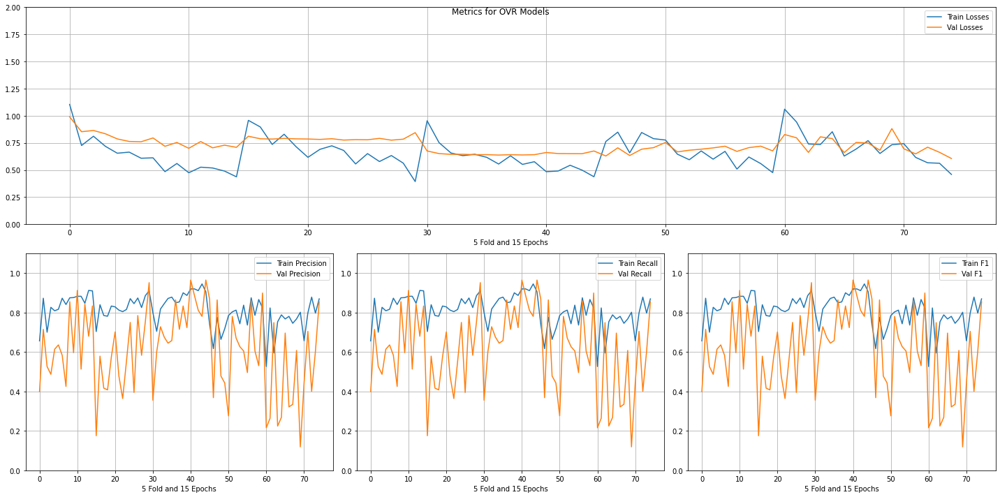

    train_f1  validation_f1  ...  train_losses  validation_losses
14  0.905598       0.964912  ...      0.437511           0.675031
10  0.919868       0.964912  ...      0.484134           0.661128
14  0.909989       0.951754  ...      0.393233           0.844026
10  0.882547       0.912281  ...      0.474536           0.699636
14  0.823271       0.899123  ...      0.475782           0.675742
..       ...            ...  ...           ...                ...
1   0.823465       0.264317  ...      0.942329           0.796632
3   0.753289       0.224670  ...      0.734515           0.805483
0   0.526316       0.215859  ...      1.060536           0.826529
0   0.703622       0.175439  ...      0.957403           0.810949
9   0.801535       0.118943  ...      0.732649           0.881291

[75 rows x 8 columns]
Training for ['దేవగాంధారి'] with 35 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.51585145 16.27142857]
Epoch 1/15 : Training Loss: 1.334 / Validation 

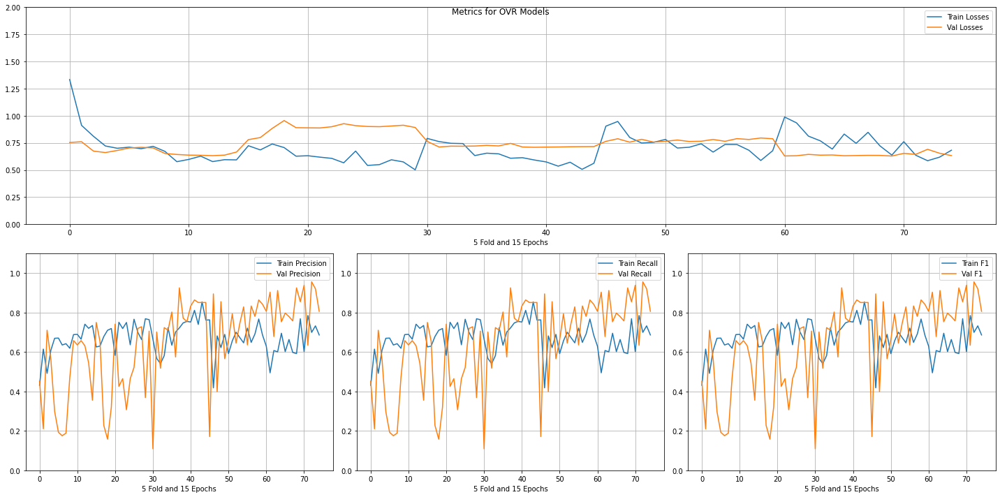

    train_f1  validation_f1  ...  train_losses  validation_losses
12  0.699561       0.955947  ...      0.585354           0.690517
10  0.601974       0.938326  ...      0.761137           0.653393
7   0.722283       0.925439  ...      0.608145           0.745101
8   0.592105       0.925110  ...      0.722262           0.634423
13  0.732456       0.920705  ...      0.618100           0.654400
..       ...            ...  ...           ...                ...
7   0.642151       0.188596  ...      0.717974           0.703474
6   0.635565       0.175439  ...      0.696112           0.708613
0   0.762898       0.171053  ...      0.903897           0.763997
3   0.710209       0.157895  ...      0.706459           0.955541
0   0.665203       0.109649  ...      0.791199           0.764083

[75 rows x 8 columns]
Training for ['దేసాక్షి'] with 29 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.51306306 19.63793103]
Epoch 1/15 : Training Loss: 1.925 / Validation Lo

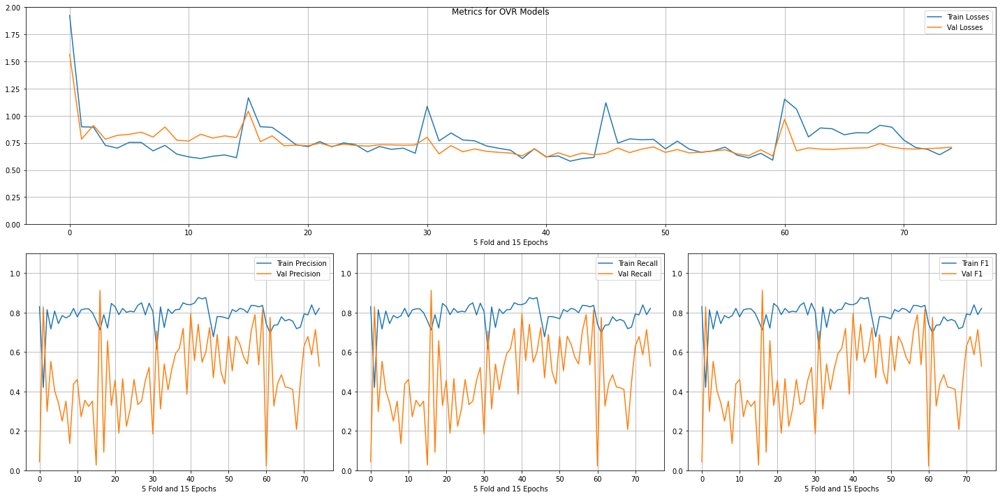

    train_f1  validation_f1  ...  train_losses  validation_losses
1   0.712404       0.912281  ...      0.898716           0.761279
1   0.420417       0.828947  ...      0.897888           0.784405
14  0.836443       0.815789  ...      0.590604           0.628250
10  0.839737       0.793860  ...      0.621094           0.618524
12  0.835346       0.789474  ...      0.611739           0.632466
..       ...            ...  ...           ...                ...
8   0.783754       0.135965  ...      0.726680           0.896214
2   0.789243       0.092105  ...      0.892528           0.814997
0   0.829857       0.043860  ...      1.924689           1.566835
0   0.758507       0.026316  ...      1.165625           1.041811
0   0.742325       0.022026  ...      1.152666           0.966970

[75 rows x 8 columns]
Training for ['దేసాళం'] with 40 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.51819836 14.2375    ]
Epoch 1/15 : Training Loss: 1.115 / Validation Loss

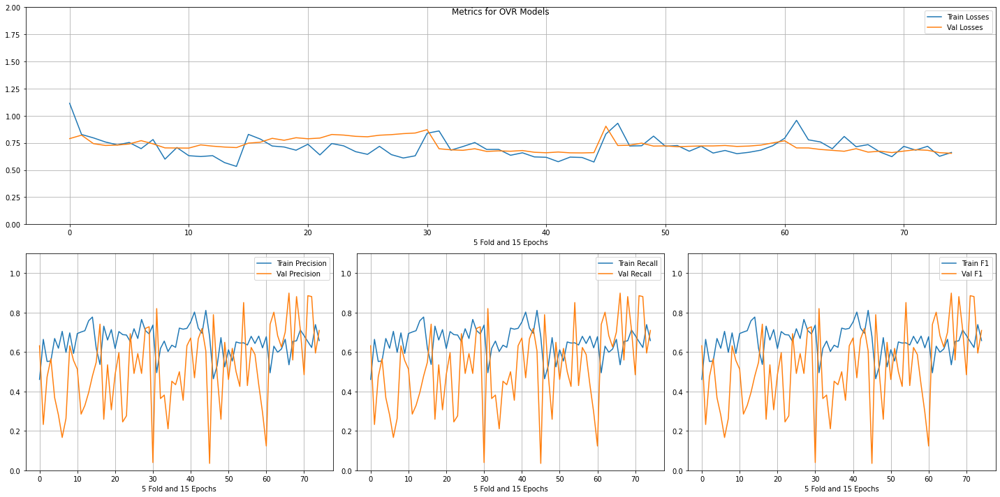

    train_f1  validation_f1  ...  train_losses  validation_losses
6   0.535088       0.898678  ...      0.714373           0.696151
11  0.652412       0.885463  ...      0.683040           0.686780
12  0.622807       0.881057  ...      0.718358           0.681435
8   0.656798       0.881057  ...      0.665865           0.672927
9   0.646542       0.850877  ...      0.655982           0.721620
..       ...            ...  ...           ...                ...
4   0.602634       0.210526  ...      0.752863           0.695722
6   0.704720       0.166667  ...      0.696742           0.770223
0   0.677632       0.123348  ...      0.792103           0.769131
0   0.736553       0.039474  ...      0.838695           0.871315
0   0.678375       0.035088  ...      0.831113           0.903507

[75 rows x 8 columns]
Training for ['ధన్నాసి'] with 20 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.50893655 28.475     ]
Epoch 1/15 : Training Loss: 1.060 / Validation Los

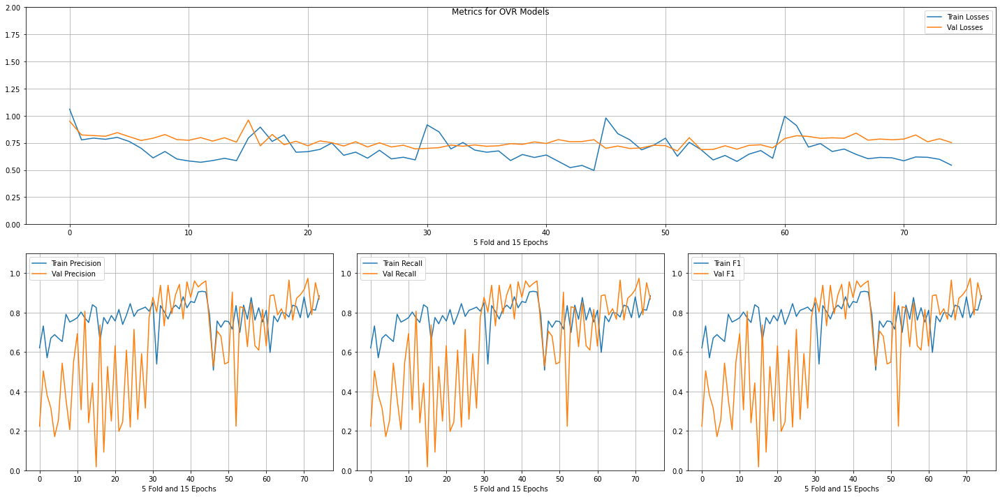

    train_f1  validation_f1  ...  train_losses  validation_losses
11  0.774123       0.973568  ...      0.619885           0.822728
6   0.777412       0.964758  ...      0.643779           0.839865
14  0.904501       0.960526  ...      0.496023           0.779176
11  0.850714       0.960526  ...      0.580197           0.779632
9   0.824369       0.956140  ...      0.615243           0.758771
..       ...            ...  ...           ...                ...
8   0.751921       0.206140  ...      0.670249           0.826410
6   0.815587       0.197368  ...      0.689606           0.767970
4   0.688255       0.171053  ...      0.800455           0.844205
2   0.774973       0.092105  ...      0.763105           0.827887
0   0.825467       0.017544  ...      0.794337           0.960804

[75 rows x 8 columns]
Training for ['నాట'] with 25 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.51122083 22.78      ]
Epoch 1/15 : Training Loss: 1.121 / Validation Loss : 

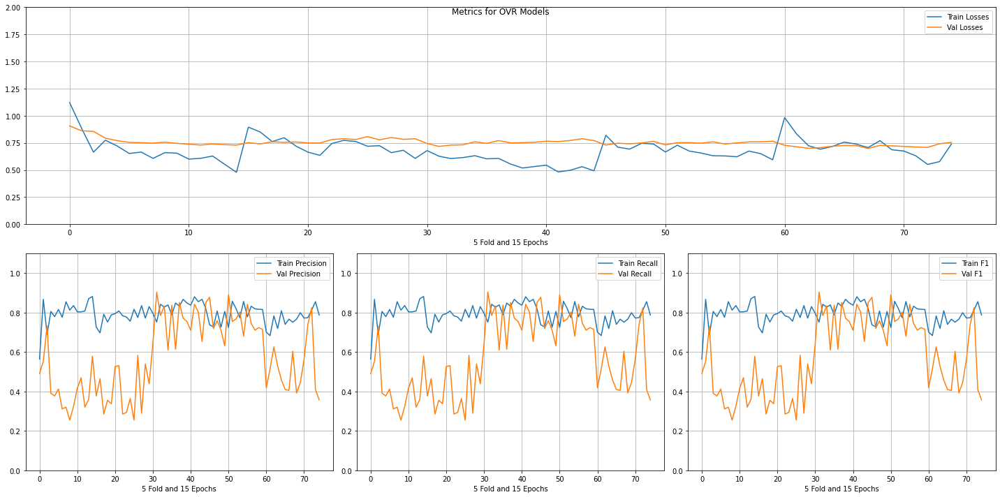

    train_f1  validation_f1  ...  train_losses  validation_losses
1   0.751921       0.903509  ...      0.626710           0.717250
5   0.724479       0.890351  ...      0.665778           0.731237
0   0.737651       0.877193  ...      0.819638           0.729625
14  0.819978       0.850877  ...      0.492110           0.770581
7   0.832053       0.850877  ...      0.554858           0.749622
..       ...            ...  ...           ...                ...
12  0.835346       0.289474  ...      0.659537           0.799218
7   0.783754       0.285088  ...      0.743699           0.780539
2   0.791438       0.285088  ...      0.761815           0.760189
8   0.812294       0.254386  ...      0.660097           0.756546
10  0.816685       0.254386  ...      0.718552           0.807041

[75 rows x 8 columns]
Training for ['నాదరామక్రియ'] with 11 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.50487589 51.77272727]
Epoch 1/15 : Training Loss: 1.123 / Validation

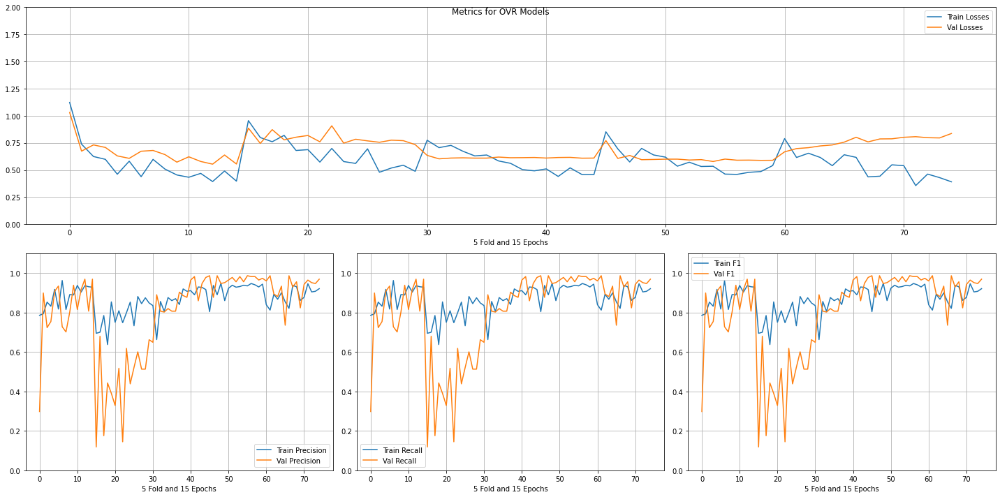

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.804610       0.986842  ...      0.851994           0.770890
2   0.890231       0.986842  ...      0.573879           0.633668
10  0.935236       0.986842  ...      0.462000           0.600418
1   0.812500       0.986784  ...      0.615413           0.697121
6   0.821272       0.986784  ...      0.616271           0.801471
..       ...            ...  ...           ...                ...
5   0.750823       0.328947  ...      0.687284           0.817933
0   0.785950       0.298246  ...      1.123014           1.030350
2   0.784852       0.175439  ...      0.760425           0.871902
7   0.748628       0.144737  ...      0.698326           0.907090
0   0.694841       0.118421  ...      0.955047           0.886145

[75 rows x 8 columns]
Training for ['పాడి'] with 49 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.52247706 11.62244898]
Epoch 1/15 : Training Loss: 1.477 / Validation Loss :

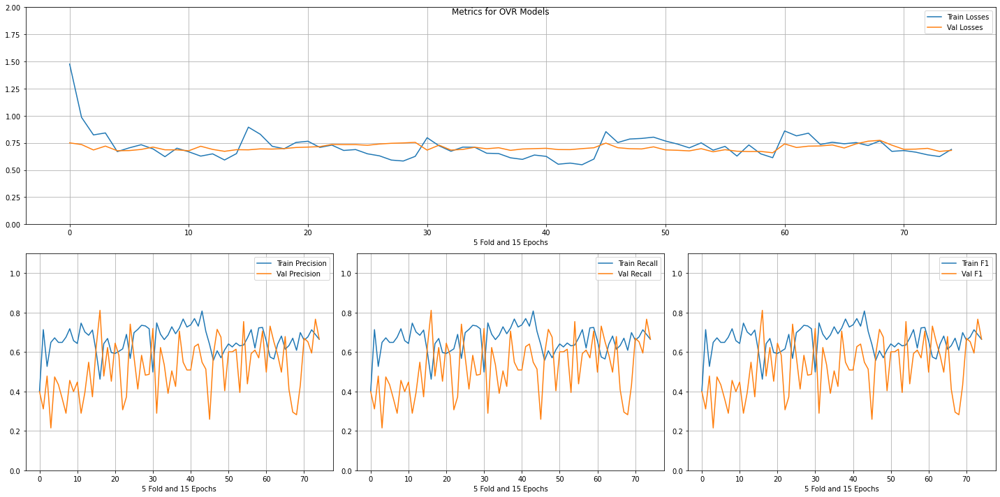

    train_f1  validation_f1  ...  train_losses  validation_losses
1   0.462130       0.811404  ...      0.829146           0.694426
13  0.688596       0.766520  ...      0.623532           0.671238
9   0.635565       0.754386  ...      0.682358           0.667509
9   0.567508       0.741228  ...      0.688144           0.733722
1   0.574561       0.731278  ...      0.814504           0.707086
..       ...            ...  ...           ...                ...
7   0.675082       0.289474  ...      0.694113           0.710836
1   0.747530       0.289474  ...      0.723035           0.728879
8   0.608553       0.281938  ...      0.768455           0.773298
0   0.637761       0.258772  ...      0.853421           0.747800
3   0.648738       0.214912  ...      0.841386           0.720143

[75 rows x 8 columns]
Training for ['బౌళి'] with 70 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [0.53274088 8.13571429]
Epoch 1/15 : Training Loss: 1.482 / Validation Loss : 0

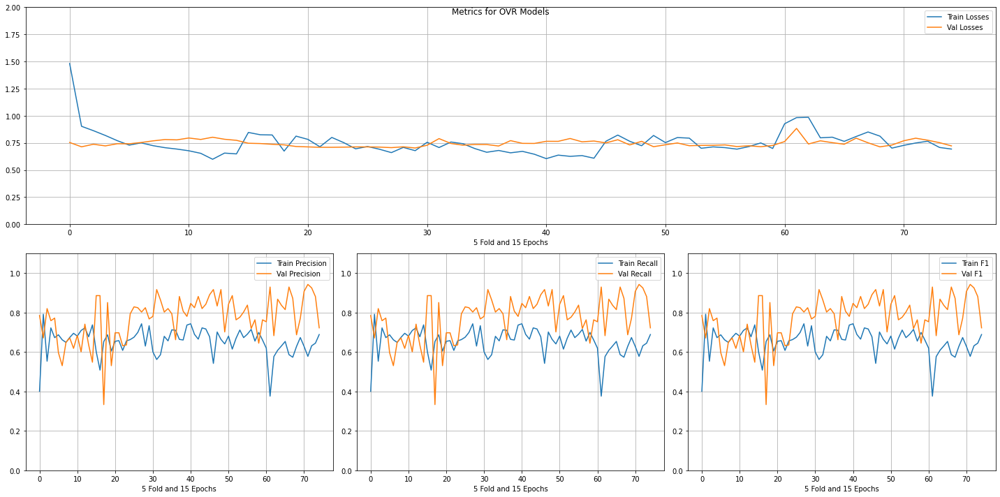

    train_f1  validation_f1  ...  train_losses  validation_losses
11  0.577851       0.942731  ...      0.748747           0.792986
6   0.586623       0.929515  ...      0.808372           0.793190
1   0.376096       0.929515  ...      0.982634           0.883247
12  0.631579       0.925110  ...      0.765127           0.774417
1   0.562020       0.916667  ...      0.706832           0.789242
..       ...            ...  ...           ...                ...
5   0.687157       0.596491  ...      0.729006           0.741544
14  0.737651       0.548246  ...      0.648143           0.773295
4   0.604830       0.530702  ...      0.811989           0.716449
6   0.661910       0.530702  ...      0.750199           0.753120
2   0.653128       0.333333  ...      0.822574           0.736735

[75 rows x 8 columns]
Training for ['బౌళిరామక్రియ'] with 13 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.50577265 43.80769231]
Epoch 1/15 : Training Loss: 1.249 / Validatio

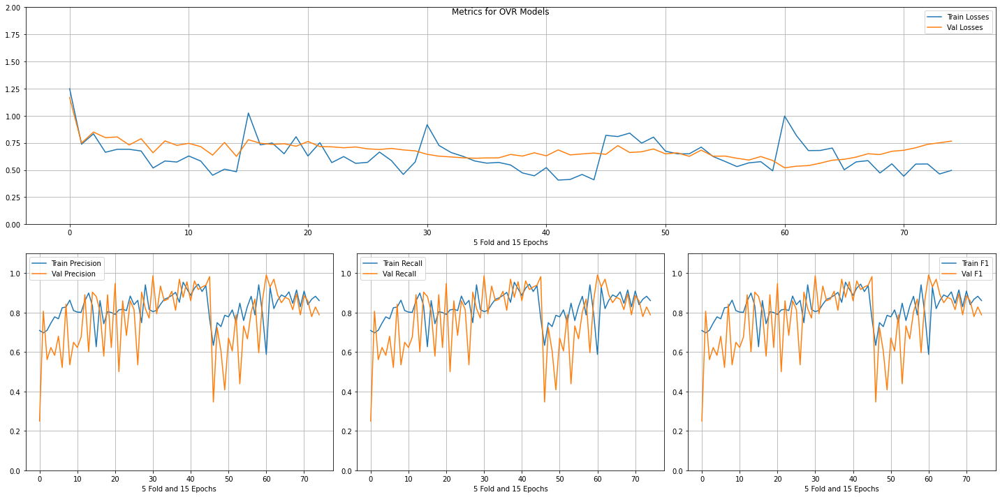

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.587719       0.991189  ...      0.997157           0.520280
0   0.804610       0.986842  ...      0.917251           0.644483
0   0.768386       0.982456  ...      0.819265           0.643991
7   0.851811       0.969298  ...      0.546051           0.643237
2   0.820175       0.969163  ...      0.678760           0.540382
..       ...            ...  ...           ...                ...
6   0.813392       0.500000  ...      0.751379           0.715879
8   0.847420       0.438596  ...      0.710698           0.682908
4   0.785950       0.407895  ...      0.802965           0.693760
1   0.633370       0.346491  ...      0.808071           0.724540
0   0.709111       0.250000  ...      1.249113           1.166821

[75 rows x 8 columns]
Training for ['భూపాలం'] with 32 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.51445348 17.796875  ]
Epoch 1/15 : Training Loss: 1.257 / Validation Loss

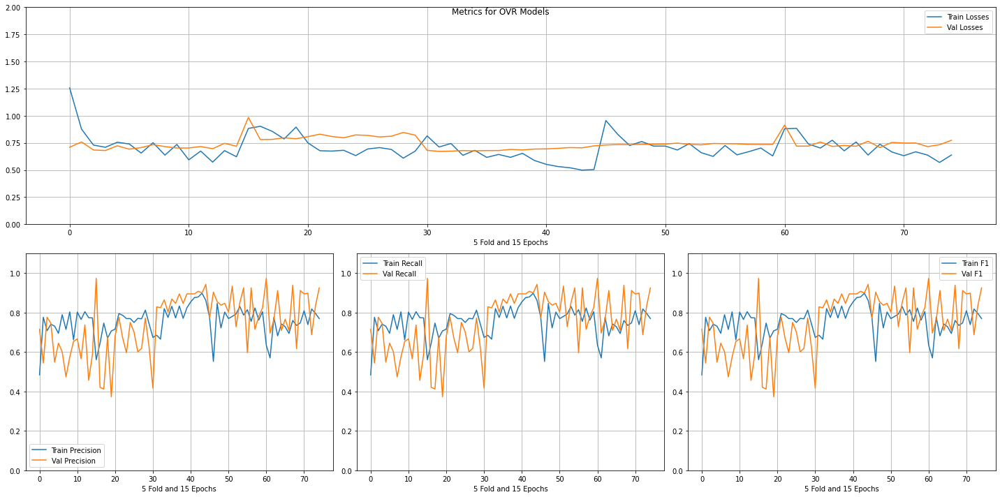

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.560922       0.973684  ...      0.882557           0.984791
0   0.634868       0.973568  ...      0.880004           0.913967
14  0.861690       0.942982  ...      0.503990           0.721962
7   0.759868       0.938326  ...      0.637879           0.764575
6   0.780461       0.934211  ...      0.684187           0.747616
..       ...            ...  ...           ...                ...
13  0.773875       0.456140  ...      0.678559           0.745724
1   0.643249       0.421053  ...      0.902966           0.780441
0   0.673985       0.416667  ...      0.814068           0.681025
2   0.746432       0.412281  ...      0.856108           0.782181
4   0.706915       0.372807  ...      0.895197           0.788069

[75 rows x 8 columns]
Training for ['భైరవి'] with 27 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.51214029 21.09259259]
Epoch 1/15 : Training Loss: 1.061 / Validation Loss 

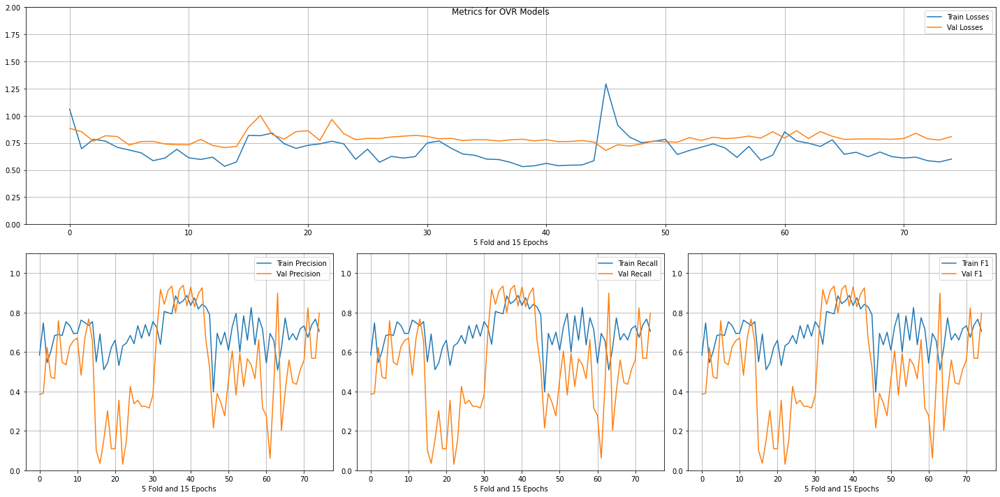

    train_f1  validation_f1  ...  train_losses  validation_losses
8   0.859495       0.938596  ...      0.531216           0.783475
5   0.793633       0.934211  ...      0.599981           0.778526
10  0.836443       0.929825  ...      0.560875           0.779273
13  0.841932       0.925439  ...      0.546479           0.771098
7   0.845225       0.916667  ...      0.569905           0.777909
..       ...            ...  ...           ...                ...
4   0.623491       0.109649  ...      0.699095           0.853235
0   0.549945       0.100877  ...      0.818347           0.892794
1   0.694079       0.061674  ...      0.767968           0.861834
1   0.691548       0.035088  ...      0.816194           1.002633
7   0.631175       0.030702  ...      0.765172           0.965794

[75 rows x 8 columns]
Training for ['మలహరి'] with 20 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.50893655 28.475     ]
Epoch 1/15 : Training Loss: 1.257 / Validation Loss 

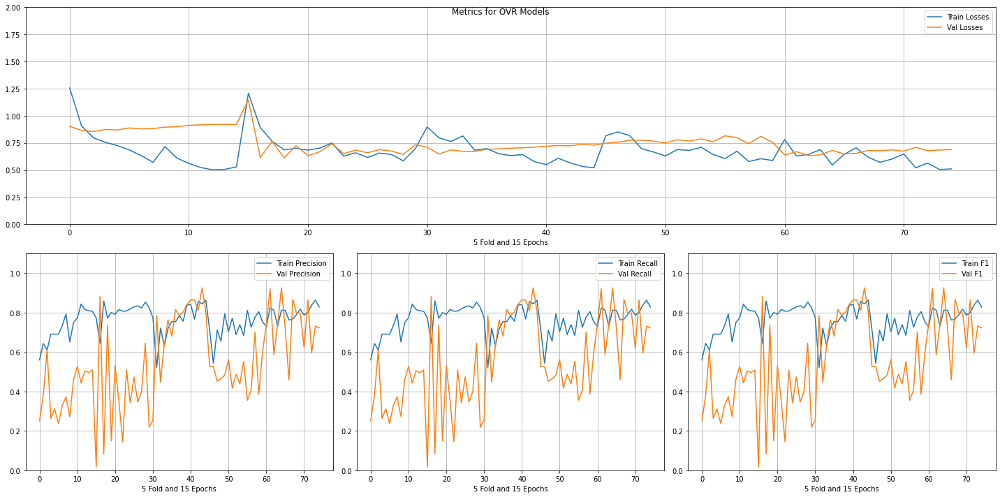

    train_f1  validation_f1  ...  train_losses  validation_losses
13  0.844127       0.925439  ...      0.532914           0.737387
4   0.812500       0.925110  ...      0.546121           0.680509
1   0.823465       0.920705  ...      0.628721           0.668345
1   0.644347       0.881579  ...      0.890109           0.614709
7   0.766447       0.867841  ...      0.618270           0.679636
..       ...            ...  ...           ...                ...
14  0.825467       0.219298  ...      0.695048           0.732094
4   0.800220       0.149123  ...      0.699623           0.724054
7   0.806806       0.144737  ...      0.748792           0.740636
2   0.858397       0.083333  ...      0.764546           0.765264
0   0.772777       0.017544  ...      1.208342           1.145362

[75 rows x 8 columns]
Training for ['మాళవి'] with 18 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.50802855 31.63888889]
Epoch 1/15 : Training Loss: 1.555 / Validation Loss 

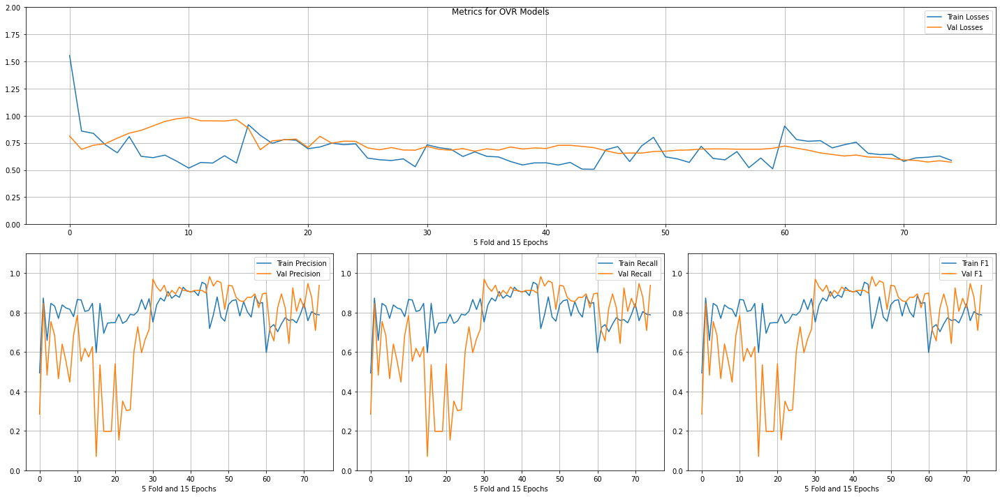

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.718990       0.982456  ...      0.686906           0.677991
0   0.751921       0.969298  ...      0.732255           0.717113
2   0.879254       0.960526  ...      0.577252           0.656478
3   0.777168       0.951754  ...      0.721626           0.655847
11  0.758772       0.947137  ...      0.611118           0.588239
..       ...            ...  ...           ...                ...
4   0.748628       0.197368  ...      0.774301           0.785031
3   0.746432       0.197368  ...      0.780385           0.778029
2   0.694841       0.197368  ...      0.745878           0.768765
6   0.791438       0.153509  ...      0.711657           0.810746
0   0.597146       0.070175  ...      0.917516           0.884740

[75 rows x 8 columns]
Training for ['మాళవిగౌళ'] with 18 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.50802855 31.63888889]
Epoch 1/15 : Training Loss: 1.623 / Validation Lo

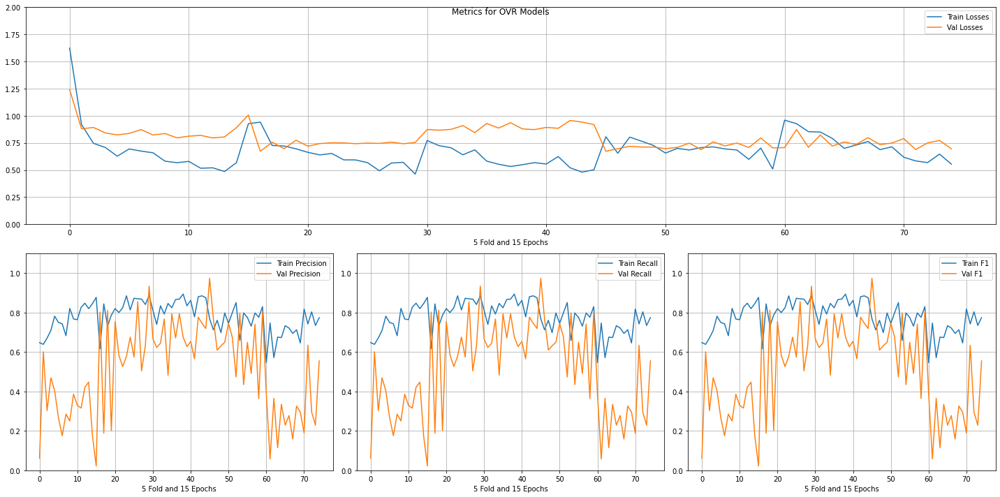

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.768386       0.973684  ...      0.806227           0.672171
14  0.885840       0.934211  ...      0.461703           0.753280
11  0.869374       0.855263  ...      0.492189           0.744976
3   0.731065       0.811404  ...      0.721039           0.696349
14  0.829857       0.802632  ...      0.508504           0.703462
..       ...            ...  ...           ...                ...
7   0.694079       0.158590  ...      0.762541           0.798249
3   0.675439       0.114537  ...      0.849700           0.821959
0   0.647640       0.061404  ...      1.623374           1.240019
1   0.746711       0.057269  ...      0.926556           0.872778
0   0.877058       0.021930  ...      0.926059           1.006730

[75 rows x 8 columns]
Training for ['ముఖారి'] with 55 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.525369   10.35454545]
Epoch 1/15 : Training Loss: 1.291 / Validation Loss

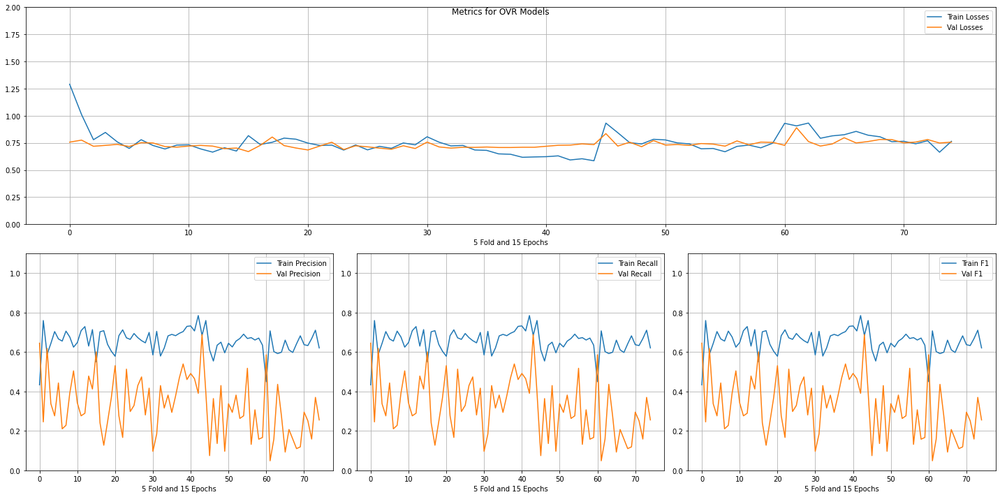

    train_f1  validation_f1  ...  train_losses  validation_losses
13  0.683864       0.688596  ...      0.603540           0.740510
0   0.433589       0.644737  ...      1.290502           0.756564
2   0.588364       0.618421  ...      0.779051           0.718439
0   0.549945       0.600877  ...      0.816497           0.669441
0   0.449561       0.585903  ...      0.930148           0.727031
..       ...            ...  ...           ...                ...
0   0.585071       0.096491  ...      0.806079           0.757109
4   0.596048       0.096491  ...      0.782878           0.770956
5   0.660088       0.092511  ...      0.824903           0.797030
0   0.610318       0.074561  ...      0.932188           0.835175
1   0.707237       0.048458  ...      0.906473           0.889718

[75 rows x 8 columns]
Training for ['రామక్రియ'] with 61 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [0.52829314 9.33606557]
Epoch 1/15 : Training Loss: 1.254 / Validation Loss

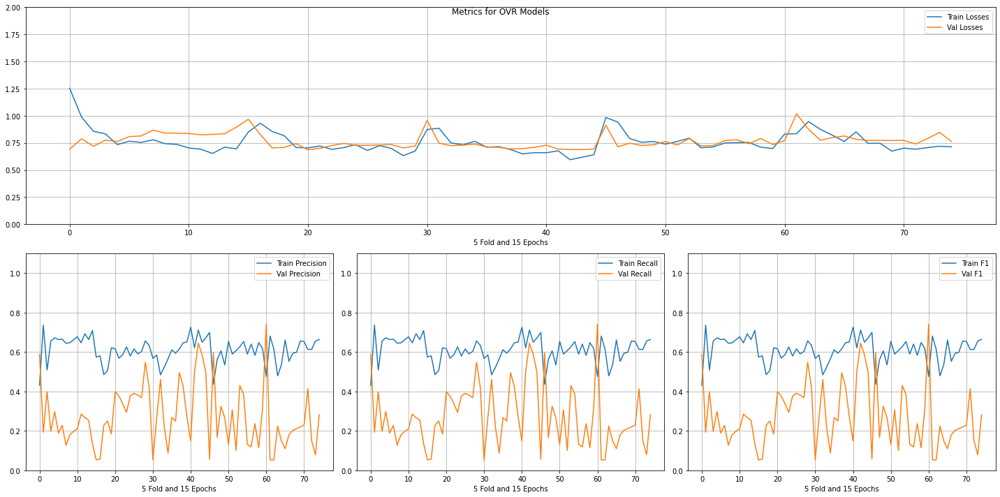

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.475877       0.740088  ...      0.830737           0.771749
12  0.711306       0.644737  ...      0.594496           0.688862
1   0.435785       0.596491  ...      0.941491           0.713714
0   0.431394       0.587719  ...      1.253568           0.691527
13  0.649835       0.587719  ...      0.617379           0.688400
..       ...            ...  ...           ...                ...
0   0.699232       0.057018  ...      0.983898           0.912505
2   0.614035       0.052863  ...      0.946135           0.875596
1   0.680921       0.052863  ...      0.834764           1.017516
0   0.567508       0.052632  ...      0.873592           0.956736
0   0.574094       0.052632  ...      0.850385           0.967553

[75 rows x 8 columns]
Training for ['లలిత'] with 98 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [0.54707012 5.81122449]
Epoch 1/15 : Training Loss: 1.365 / Validation Loss : 0

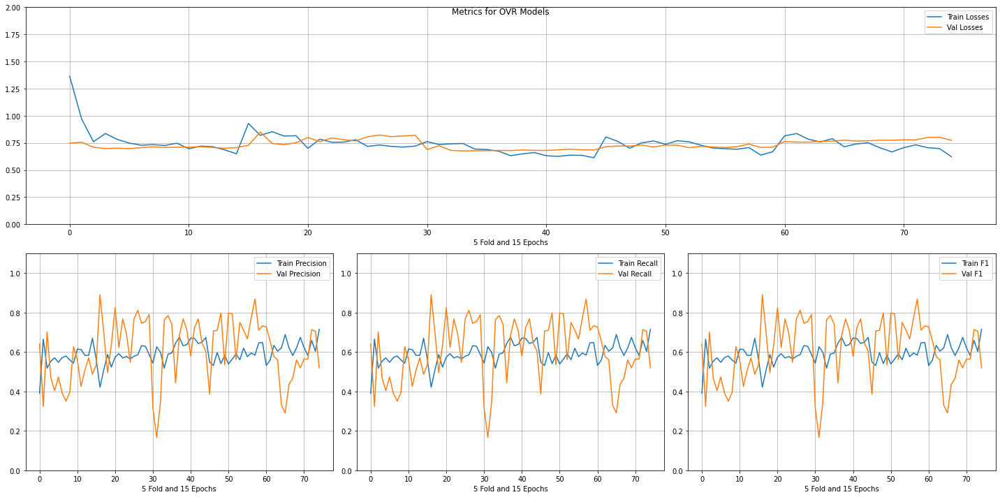

    train_f1  validation_f1  ...  train_losses  validation_losses
1   0.421515       0.890351  ...      0.819172           0.849203
12  0.583974       0.868421  ...      0.706407           0.737771
5   0.574094       0.824561  ...      0.699211           0.799062
11  0.586169       0.811404  ...      0.730559           0.822490
5   0.538968       0.798246  ...      0.736434           0.729701
..       ...            ...  ...           ...                ...
4   0.620614       0.330396  ...      0.789023           0.765334
1   0.665203       0.324561  ...      0.972397           0.755636
0   0.543359       0.315789  ...      0.762030           0.688765
5   0.688596       0.290749  ...      0.713920           0.774959
1   0.626784       0.166667  ...      0.733715           0.722280

[75 rows x 8 columns]
Training for ['వరాళి'] with 22 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.50984781 25.88636364]
Epoch 1/15 : Training Loss: 1.147 / Validation Loss 

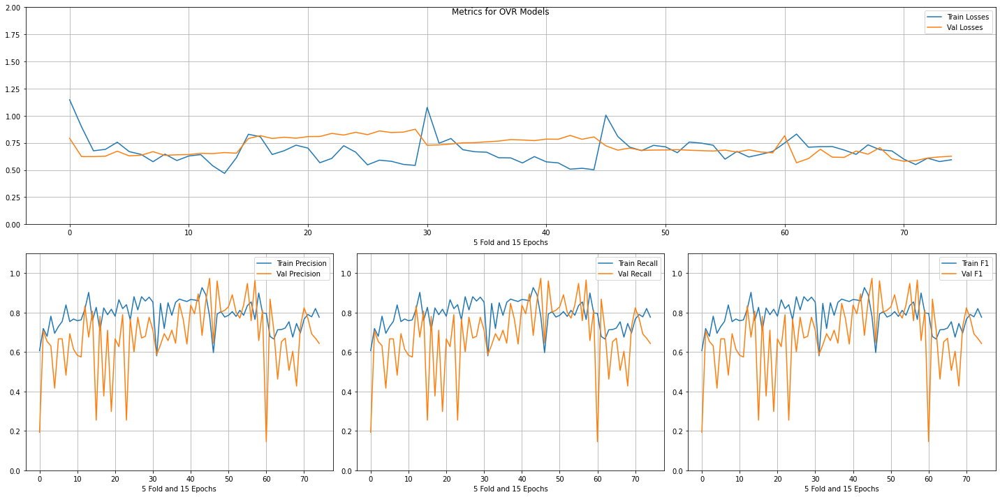

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.781559       0.973684  ...      1.005492           0.722625
12  0.765093       0.964912  ...      0.619755           0.685874
2   0.792536       0.960526  ...      0.710607           0.701795
10  0.835346       0.947368  ...      0.599482           0.683417
12  0.859495       0.894737  ...      0.507431           0.818509
..       ...            ...  ...           ...                ...
4   0.816685       0.298246  ...      0.728632           0.792949
0   0.826564       0.254386  ...      0.829176           0.789735
8   0.839737       0.254386  ...      0.723397           0.821874
0   0.607025       0.192982  ...      1.147169           0.792243
0   0.796053       0.145374  ...      0.748501           0.815595

[75 rows x 8 columns]
Training for ['శంకరాభరణం'] with 68 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [0.53174603 8.375     ]
Epoch 1/15 : Training Loss: 1.396 / Validation Los

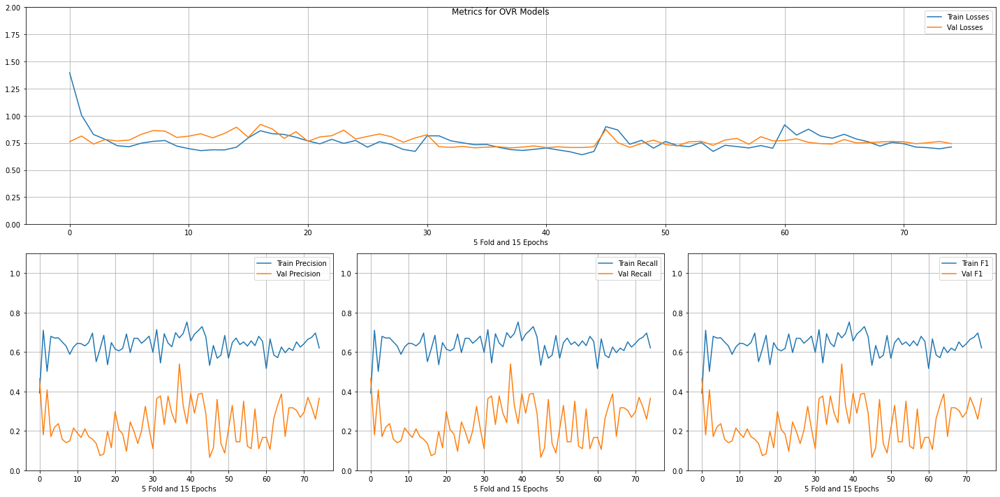

    train_f1  validation_f1  ...  train_losses  validation_losses
7   0.671789       0.539474  ...      0.687955           0.703522
0   0.391877       0.464912  ...      1.395823           0.760947
2   0.501647       0.407895  ...      0.827562           0.739104
13  0.728869       0.390351  ...      0.640335           0.707058
10  0.656422       0.390351  ...      0.702933           0.705891
..       ...            ...  ...           ...                ...
8   0.691548       0.096491  ...      0.744681           0.867217
4   0.683864       0.087719  ...      0.700935           0.775029
2   0.684962       0.083333  ...      0.834528           0.878549
1   0.614709       0.074561  ...      0.861536           0.920027
0   0.532382       0.065789  ...      0.899659           0.872815

[75 rows x 8 columns]
Training for ['శుద్ధవసంతం'] with 33 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.51491863 17.25757576]
Epoch 1/15 : Training Loss: 1.363 / Validation 

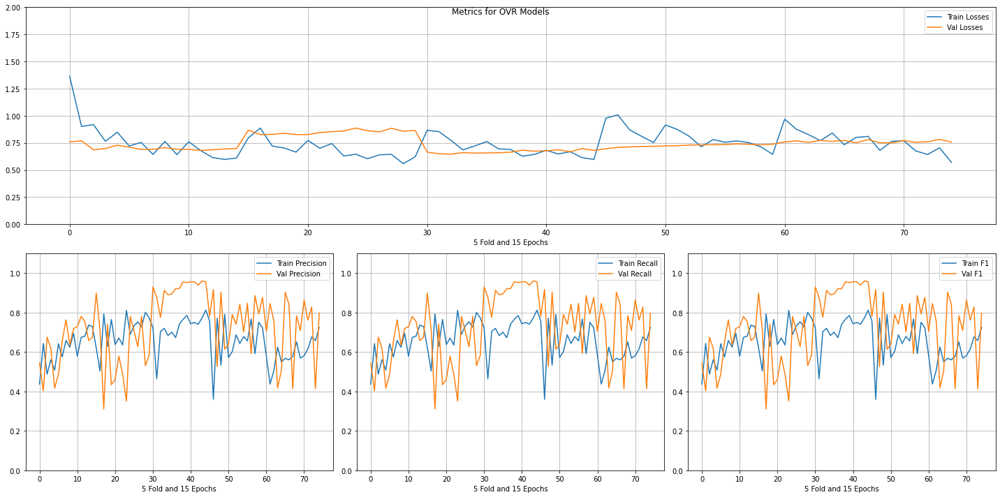

    train_f1  validation_f1  ...  train_losses  validation_losses
13  0.772777       0.960526  ...      0.613903           0.697322
14  0.812294       0.956140  ...      0.597020           0.680112
8   0.766191       0.956140  ...      0.627478           0.682166
10  0.743139       0.956140  ...      0.681463           0.676814
11  0.749726       0.956140  ...      0.647552           0.686501
..       ...            ...  ...           ...                ...
7   0.577851       0.414097  ...      0.809728           0.780157
13  0.657895       0.414097  ...      0.704363           0.782476
1   0.643249       0.403509  ...      0.901427           0.768932
8   0.811196       0.350877  ...      0.628523           0.859178
2   0.792536       0.311404  ...      0.720509           0.828021

[75 rows x 8 columns]
Training for ['శ్రీరాగం'] with 65 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [0.53026071 8.76153846]
Epoch 1/15 : Training Loss: 1.573 / Validation Loss

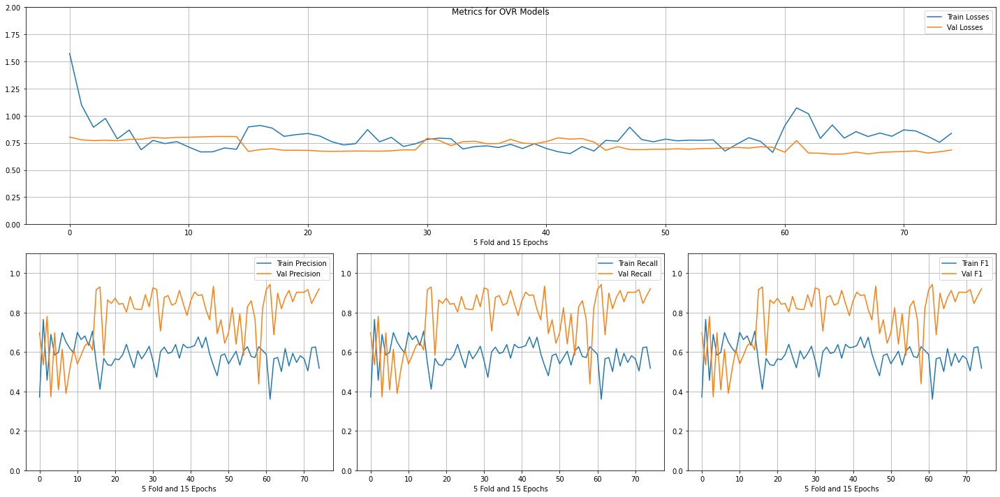

    train_f1  validation_f1  ...  train_losses  validation_losses
1   0.360746       0.942731  ...      1.071922           0.770935
1   0.531284       0.934211  ...      0.765216           0.714844
1   0.411636       0.929825  ...      0.910221           0.688345
0   0.555434       0.925439  ...      0.781216           0.792826
14  0.517544       0.920705  ...      0.838215           0.684279
..       ...            ...  ...           ...                ...
8   0.619100       0.513158  ...      0.743277           0.793275
13  0.626784       0.438596  ...      0.762403           0.713966
5   0.598244       0.407895  ...      0.867740           0.782484
7   0.650933       0.390351  ...      0.772627           0.799443
3   0.689352       0.372807  ...      0.975133           0.774477

[75 rows x 8 columns]
Training for ['సామంతం'] with 89 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [0.54238095 6.3988764 ]
Epoch 1/15 : Training Loss: 1.366 / Validation Loss :

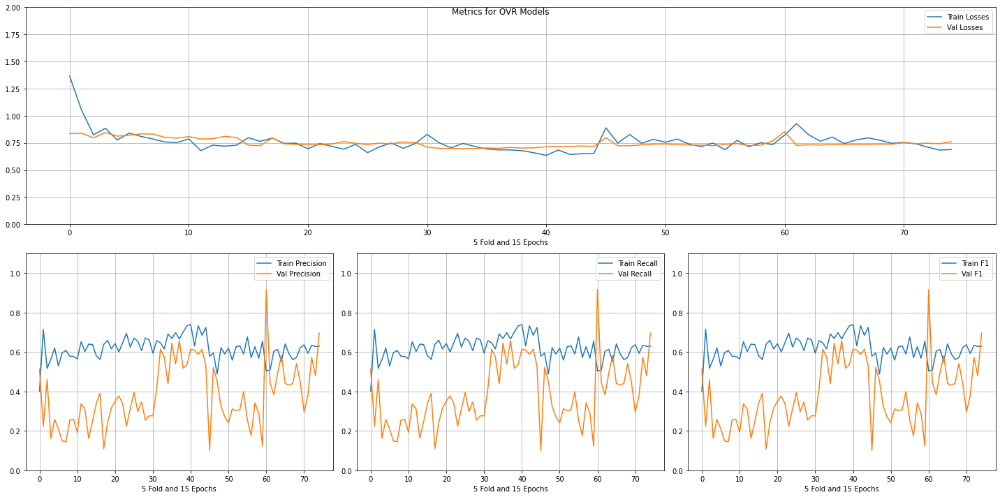

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.503289       0.916300  ...      0.821418           0.853123
14  0.629386       0.696035  ...      0.687920           0.760698
7   0.666301       0.657895  ...      0.684498           0.707918
5   0.668496       0.644737  ...      0.693919           0.702735
2   0.646542       0.614035  ...      0.704228           0.697580
..       ...            ...  ...           ...                ...
6   0.596048       0.149123  ...      0.809828           0.833095
7   0.608123       0.144737  ...      0.784764           0.830770
14  0.655324       0.122807  ...      0.733655           0.768141
2   0.638858       0.109649  ...      0.795013           0.795149
0   0.578485       0.100877  ...      0.888851           0.798010

[75 rows x 8 columns]
Training for ['సాళంగం'] with 11 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [ 0.50487589 51.77272727]
Epoch 1/15 : Training Loss: 1.143 / Validation Loss

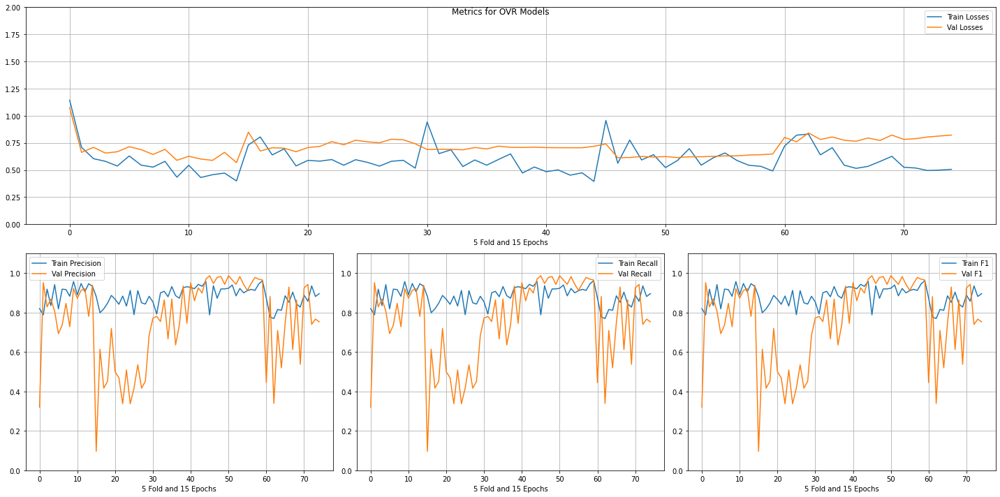

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.788145       0.986842  ...      0.956329           0.740646
5   0.923161       0.986842  ...      0.522478           0.623654
3   0.919868       0.982456  ...      0.592382           0.624539
8   0.922064       0.982456  ...      0.544237           0.622016
2   0.872667       0.978070  ...      0.775630           0.615190
..       ...            ...  ...           ...                ...
2   0.769737       0.339207  ...      0.830699           0.841324
7   0.883644       0.337719  ...      0.596049           0.761695
9   0.912184       0.337719  ...      0.594585           0.774667
0   0.819978       0.320175  ...      1.143348           1.073802
0   0.881449       0.096491  ...      0.730912           0.848239

[75 rows x 8 columns]
Training for ['సాళంగనాట'] with 94 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 911/228
Class Weights : [0.54497608 6.05851064]
Epoch 1/15 : Training Loss: 1.127 / Validation Loss

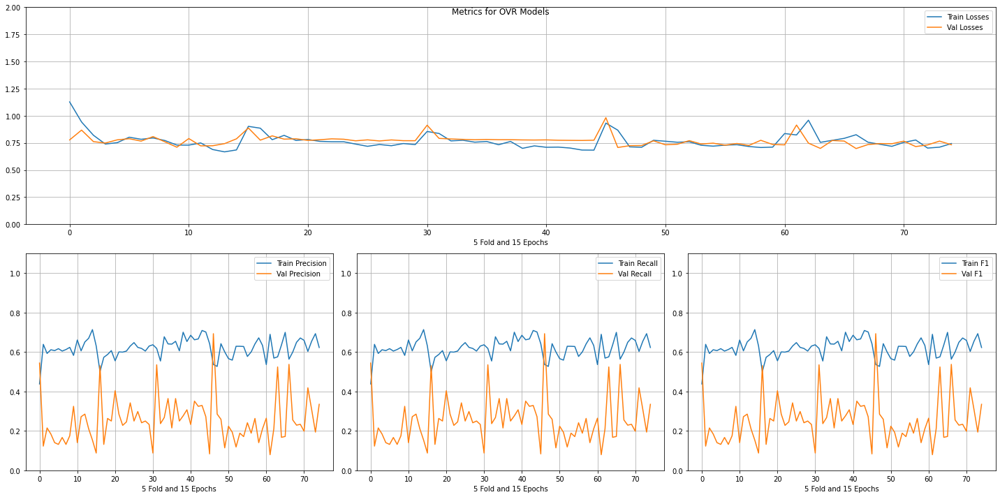

    train_f1  validation_f1  ...  train_losses  validation_losses
1   0.536773       0.692982  ...      0.866980           0.707312
0   0.437980       0.543860  ...      1.127319           0.777137
6   0.563596       0.537445  ...      0.825014           0.697635
1   0.618002       0.535088  ...      0.836545           0.791150
1   0.500549       0.530702  ...      0.885157           0.775016
..       ...            ...  ...           ...                ...
4   0.600439       0.114035  ...      0.773639           0.768798
0   0.636663       0.087719  ...      0.854877           0.912660
0   0.630077       0.087719  ...      0.902093           0.886937
0   0.642151       0.083333  ...      0.932341           0.982351
1   0.689693       0.079295  ...      0.822779           0.914211

[75 rows x 8 columns]


In [21]:
le = LabelEncoder()
le.fit(data['Ragam'])
labels = le.transform(le.classes_)
ovr_res = ovr_train_model(data, MfccMatrixDataset, MfccRaga, "OVR Models", labels, le.classes_, lbl_encoder=le, lr=1e-6, epochs=15, n_folds=5)

# Mapping each Raga with Janaka Ragam

In [22]:
janaka_raga_map ={'లలిత':'Mayamalavagowla',
'సాళంగనాట':'Mayamalavagowla',
'సామంతం':'Naganandini',
'బౌళి':'Mayamalavagowla',
'శంకరాభరణం':'Shankarabharanam',
'శ్రీరాగం':'Kharaharapriya',
'రామక్రియ':'Mayamalavagowla',
'ముఖారి':'Kharaharapriya',
'పాడి':'Mayamalavagowla',
'ఆహిరి':'Vakulabharanam',
'దేసాళం':'Unknown',
'దేవగాంధారి':'Shankarabharanam',
'శుద్ధవసంతం':'Shankarabharanam',
'భూపాలం':'Shubhapantuvarali',
'దేసాక్షి':'Harikambhoji',
'గుండుక్రియ':'Mayamalavagowla',
'భైరవి':'Natabhairavi',
'నాట':'Chalanata',
'వరాళి':'Jhalavarali',
'ధన్నాసి':'Hanumatodi',
'మలహరి':'Mayamalavagowla',
'కాంబోది':'Harikambhoji',
'మాళవిగౌళ':'Mayamalavagowla',
'మాళవి':'Harikambhoji',
'గుజ్జరి':'Unknown',
'కన్నడగౌళ':'Kharaharapriya',
'గౌళ':'Mayamalavagowla',
'బౌళిరామక్రియ':'Mayamalavagowla',
'నాదరామక్రియ':'Unknown',
'సాళంగం':'Kalyani'}

In [23]:
data['janaka_ragam'] = data.apply(lambda x:janaka_raga_map[x['Ragam']],axis=1)

In [24]:
jle = LabelEncoder()
jle.fit(data['janaka_ragam'])
data['JanakaRagamCode'] = data.apply(lambda x:jle.transform([x.janaka_ragam])[0],axis=1)
n_labels = len(data['RagamCode'].unique())

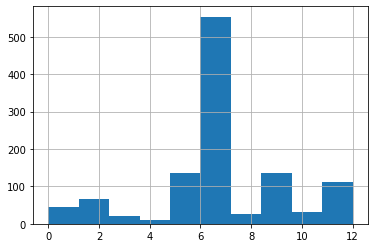

In [25]:
data['JanakaRagamCode'].hist()

In [26]:
class MfccMatrixJanakaRagaDataset(AbsDataset):
    def __init__(self, labels, mfcc_vals):
        super().__init__()
        self.labels = labels
        self.mfcc_vals = mfcc_vals

    def __get__(self,index):
      if self.mfcc_vals[index].shape[1] < 7501:
        self.mfcc_vals[index] = torch.hstack((self.mfcc_vals[index],torch.zeros(40,7501-self.mfcc_vals[index].shape[1])))
      return self.mfcc_vals[index].reshape((1,)+self.mfcc_vals[index].shape)

    def __len__(self):
        return len(self.labels)

    def __iter__(self):
        for index, _ in enumerate(self.labels):
            yield self.__get__(index), self.labels[index]

    def __getitem__(self, index):
        return self.__get__(index), self.labels[index]

    @staticmethod
    def prepare_data(data, train_ids, test_ids):
      train_lbls = torch.tensor([data['JanakaRagamCode'].iloc[x] for x in train_ids])
      test_lbls = torch.tensor([data['JanakaRagamCode'].iloc[x] for x in test_ids])
      train_vals = [data['mfcc'].iloc[x] for x in train_ids]
      test_vals = [data['mfcc'].iloc[x] for x in test_ids]
      train_data = MfccMatrixDataset(train_lbls, train_vals)
      test_data = MfccMatrixDataset(test_lbls, test_vals)
      return train_data, test_data, train_lbls, test_lbls

Training for ['Chalanata'] with 25 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 569/570
Class Weights : [ 0.51122083 22.78      ]
Epoch 1/15 : Training Loss: 1.897 / Validation Loss : 0.788 [Time Taken : 1.834234 seconds]
[[275 282]
 [  9   3]]
[[268 289]
 [  6   7]]
Epoch 2/15 : Training Loss: 1.375 / Validation Loss : 2.277 [Time Taken : 1.674061 seconds]
[[413 144]
 [  8   4]]
[[  0 557]
 [  0  13]]
Epoch 3/15 : Training Loss: 1.514 / Validation Loss : 0.757 [Time Taken : 1.855908 seconds]
[[425 132]
 [  8   4]]
[[459  98]
 [  9   4]]
Epoch 4/15 : Training Loss: 0.660 / Validation Loss : 0.767 [Time Taken : 1.662113 seconds]
[[358 199]
 [  4   8]]
[[478  79]
 [ 12   1]]
Epoch 5/15 : Training Loss: 0.440 / Validation Loss : 0.761 [Time Taken : 1.642574 seconds]
[[476  81]
 [  4   8]]
[[422 135]
 [  9   4]]
Epoch 6/15 : Training Loss: 0.541 / Validation Loss : 1.083 [Time Taken : 1.643326 seconds]
[[468  89]
 [  4   8]]
[[ 45 512]
 [  0  13]]
Epoch 7/15 : Training Loss: 0.613 /

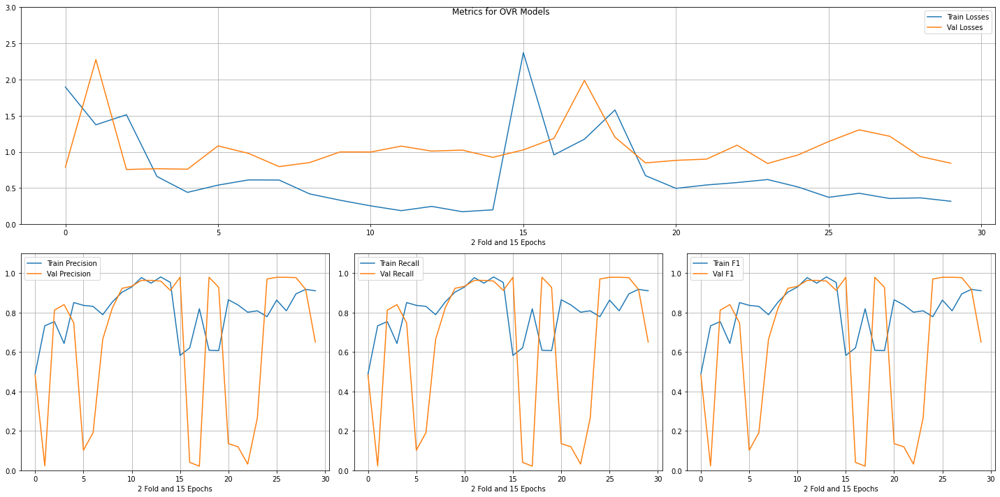

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.582456       0.978910  ...      2.372325           1.028129
11  0.808772       0.978910  ...      0.427482           1.305050
10  0.863158       0.978910  ...      0.372284           1.143645
3   0.608772       0.978910  ...      1.579643           1.203589
12  0.894737       0.977153  ...      0.355511           1.216085
9   0.778947       0.970123  ...      0.514534           0.958763
11  0.977153       0.963158  ...      0.187635           1.080016
12  0.949033       0.963158  ...      0.245929           1.010939
13  0.980668       0.959649  ...      0.172859           1.025113
10  0.929701       0.933333  ...      0.253729           0.998122
4   0.607018       0.927944  ...      0.671440           0.847716
9   0.903339       0.922807  ...      0.331535           0.999389
13  0.917544       0.917399  ...      0.364775           0.936435
14  0.952548       0.912281  ...      0.198865           0.924383
3   0.6432

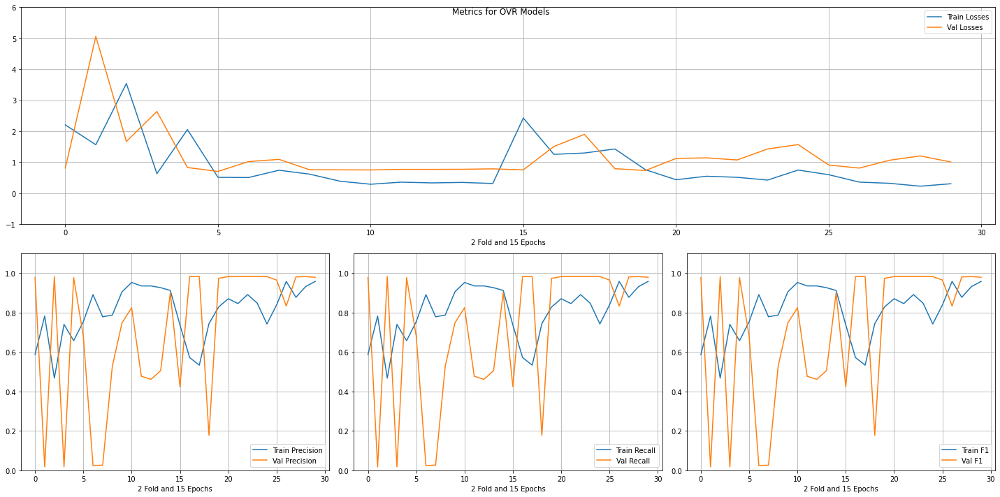

    train_f1  validation_f1  ...  train_losses  validation_losses
2   0.467487       0.982456  ...      3.539396           1.669043
1   0.571930       0.982425  ...      1.254396           1.507314
13  0.931579       0.982425  ...      0.226601           1.204312
9   0.742105       0.982425  ...      0.747487           1.569521
8   0.847368       0.982425  ...      0.424153           1.427066
7   0.891228       0.982425  ...      0.513919           1.072316
6   0.845614       0.982425  ...      0.547428           1.141524
5   0.870175       0.982425  ...      0.435567           1.121365
2   0.533333       0.982425  ...      1.296962           1.898896
12  0.877193       0.980668  ...      0.319297           1.064502
14  0.957895       0.978910  ...      0.305458           1.006542
0   0.586995       0.977193  ...      2.204294           0.810800
4   0.657293       0.977193  ...      2.053459           0.829087
4   0.828070       0.973638  ...      0.758124           0.733207
10  0.8385

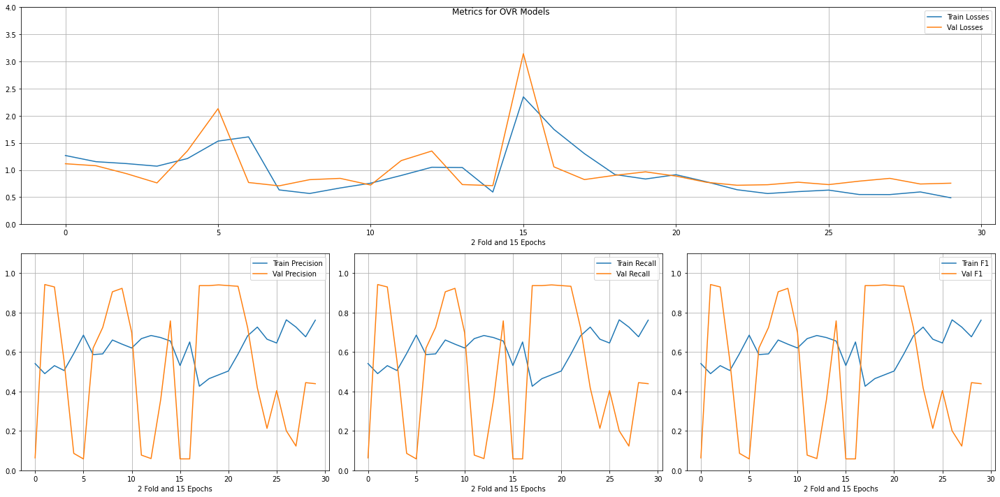

    train_f1  validation_f1  ...  train_losses  validation_losses
1   0.490334       0.942105  ...      1.152876           1.078300
4   0.484211       0.940246  ...      0.833599           0.965215
3   0.464912       0.936731  ...      0.916202           0.901825
2   0.426316       0.936731  ...      1.300925           0.822960
5   0.503509       0.936731  ...      0.912520           0.887231
6   0.589474       0.933216  ...      0.781742           0.772763
2   0.530756       0.929825  ...      1.117790           0.932473
9   0.639719       0.922807  ...      0.668044           0.845302
8   0.660808       0.905263  ...      0.566598           0.821341
14  0.655536       0.757895  ...      0.592551           0.710991
7   0.590510       0.724561  ...      0.632521           0.707521
7   0.682456       0.722320  ...      0.635607           0.718186
10  0.620387       0.698246  ...      0.756831           0.722217
6   0.586995       0.619298  ...      1.610396           0.768751
3   0.5061

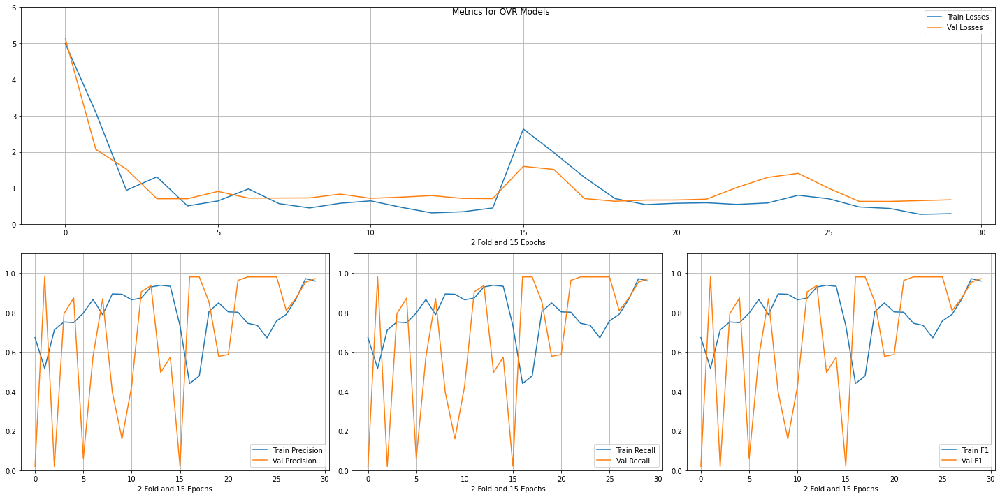

    train_f1  validation_f1  ...  train_losses  validation_losses
1   0.516696       0.980702  ...      3.090179           2.068595
1   0.440351       0.980668  ...      1.981488           1.516054
10  0.757895       0.980668  ...      0.705177           0.993897
9   0.671930       0.980668  ...      0.801180           1.407907
8   0.735088       0.980668  ...      0.588370           1.294093
7   0.745614       0.980668  ...      0.547885           1.017193
2   0.478947       0.980668  ...      1.296688           0.710254
14  0.959649       0.971880  ...      0.291980           0.676551
6   0.801754       0.963093  ...      0.593489           0.694053
13  0.971930       0.954306  ...      0.273512           0.653841
12  0.929701       0.936842  ...      0.314200           0.792460
11  0.873462       0.905263  ...      0.468078           0.749714
4   0.748682       0.873684  ...      0.507072           0.705527
12  0.868421       0.873462  ...      0.436567           0.631355
7   0.7891

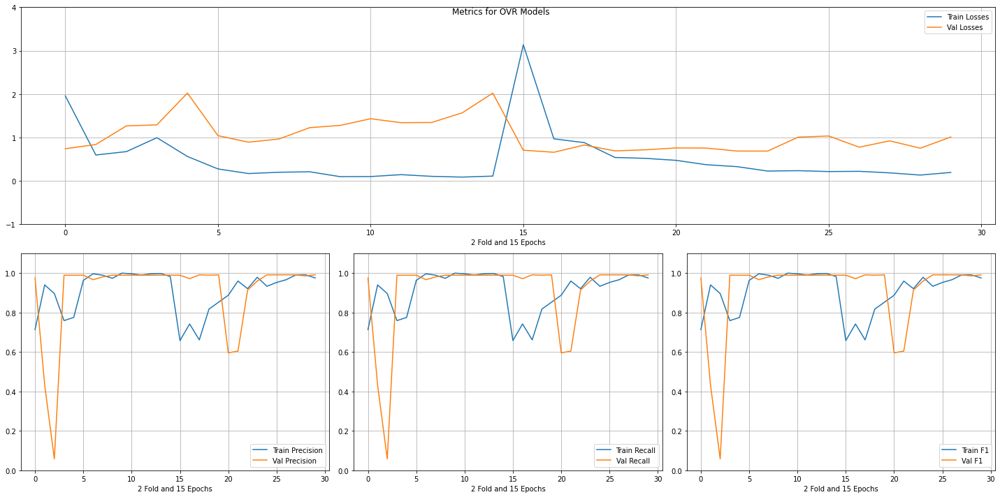

    train_f1  validation_f1  ...  train_losses  validation_losses
14  0.975439       0.991213  ...      0.193228           1.009607
11  0.966667       0.991213  ...      0.219116           0.775657
4   0.852632       0.991213  ...      0.517786           0.714970
9   0.933333       0.991213  ...      0.233682           1.006317
10  0.952632       0.991213  ...      0.213874           1.033140
2   0.661404       0.991213  ...      0.879279           0.825102
12  0.991228       0.991213  ...      0.183582           0.921257
5   0.963093       0.989474  ...      0.274072           1.041088
4   0.775044       0.989474  ...      0.561347           2.022594
8   0.973638       0.989474  ...      0.208685           1.224618
10  0.996485       0.989474  ...      0.098441           1.431064
11  0.989455       0.989474  ...      0.142264           1.340134
12  0.996485       0.989474  ...      0.103337           1.344892
13  0.998243       0.989474  ...      0.085891           1.566660
14  0.9824

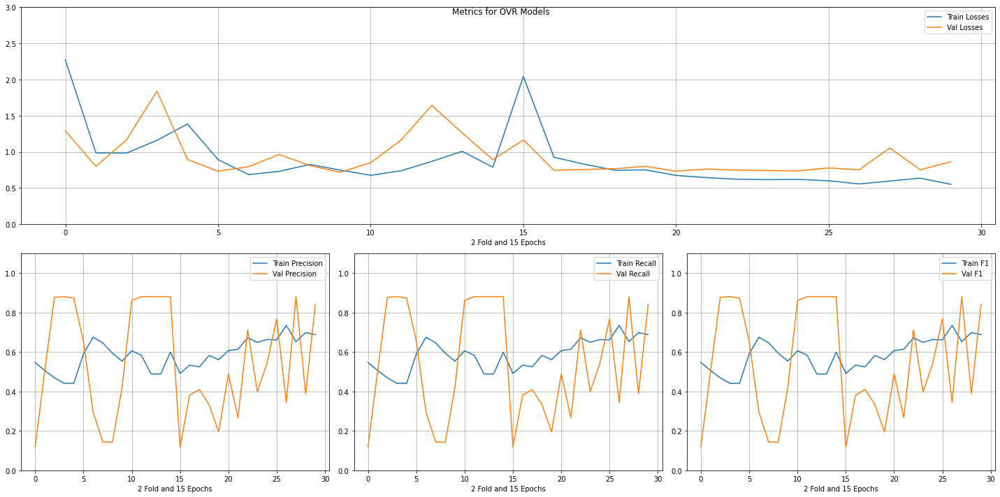

    train_f1  validation_f1  ...  train_losses  validation_losses
14  0.599297       0.880702  ...      0.787385           0.892185
11  0.583480       0.880702  ...      0.739356           1.165010
13  0.488576       0.880702  ...      1.007563           1.261068
3   0.441125       0.880702  ...      1.160259           1.839634
12  0.488576       0.880702  ...      0.868214           1.644648
12  0.652632       0.880492  ...      0.596815           1.053726
2   0.469244       0.877193  ...      0.983943           1.165530
4   0.441125       0.873684  ...      1.385047           0.894746
10  0.606327       0.861404  ...      0.676201           0.851531
14  0.687719       0.841828  ...      0.551277           0.864660
10  0.661404       0.768014  ...      0.600688           0.778396
7   0.671930       0.711775  ...      0.622387           0.748205
5   0.590510       0.654386  ...      0.893774           0.732857
9   0.663158       0.543058  ...      0.620315           0.737726
1   0.5061

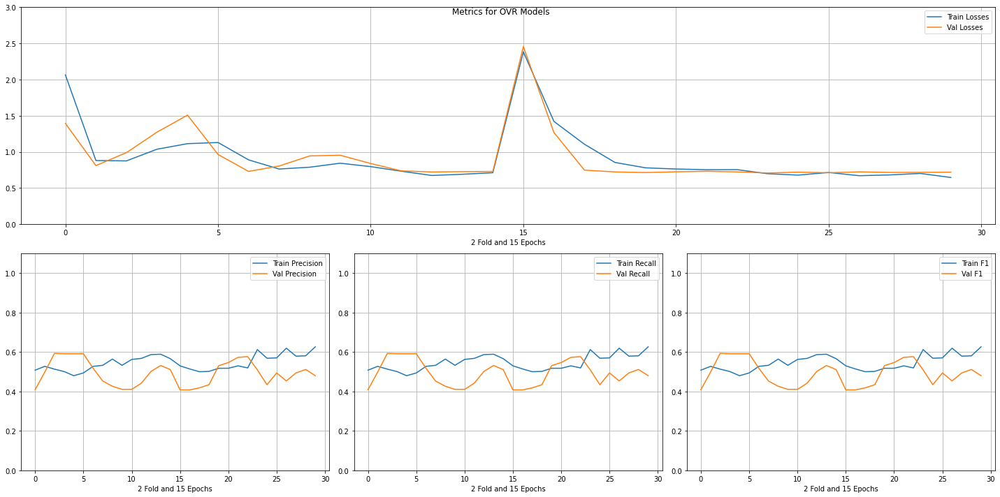

    train_f1  validation_f1  ...  train_losses  validation_losses
2   0.513181       0.592982  ...      0.875592           0.989822
3   0.500879       0.591228  ...      1.036918           1.272861
4   0.479789       0.591228  ...      1.113784           1.508310
5   0.493849       0.591228  ...      1.129996           0.964711
7   0.519298       0.576450  ...      0.754519           0.723578
6   0.529825       0.572935  ...      0.753482           0.731938
5   0.517544       0.546573  ...      0.763446           0.724260
13  0.588752       0.531579  ...      0.690710           0.726429
4   0.517544       0.530756  ...      0.779780           0.714499
6   0.527241       0.517544  ...      0.889701           0.730022
13  0.580702       0.511424  ...      0.701957           0.717191
14  0.565905       0.510526  ...      0.711883           0.729552
8   0.612281       0.509666  ...      0.698250           0.708100
12  0.586995       0.501754  ...      0.674245           0.722211
1   0.5272

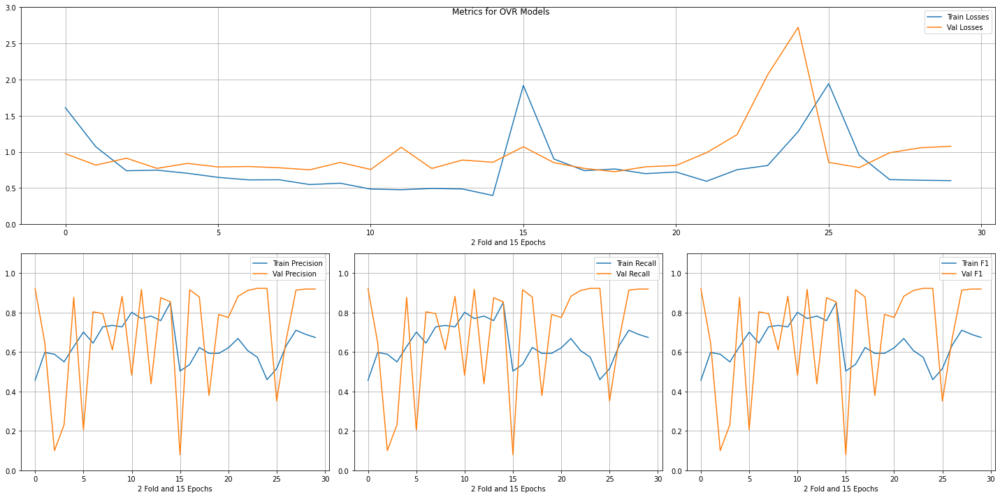

    train_f1  validation_f1  ...  train_losses  validation_losses
8   0.573684       0.922671  ...      0.811624           2.065524
9   0.459649       0.922671  ...      1.279825           2.723265
0   0.456942       0.921053  ...      1.610259           0.974684
13  0.689474       0.919156  ...      0.608233           1.056545
14  0.673684       0.919156  ...      0.602265           1.078069
11  0.769772       0.917544  ...      0.476416           1.063561
1   0.536842       0.915641  ...      0.901570           0.851092
12  0.710526       0.913884  ...      0.616823           0.988565
7   0.607018       0.912127  ...      0.753683           1.238821
9   0.727592       0.882456  ...      0.566941           0.854246
6   0.668421       0.882250  ...      0.594160           0.989225
2   0.622807       0.878735  ...      0.740817           0.771084
4   0.627417       0.877193  ...      0.704332           0.841023
13  0.759227       0.875439  ...      0.487567           0.887353
14  0.8506

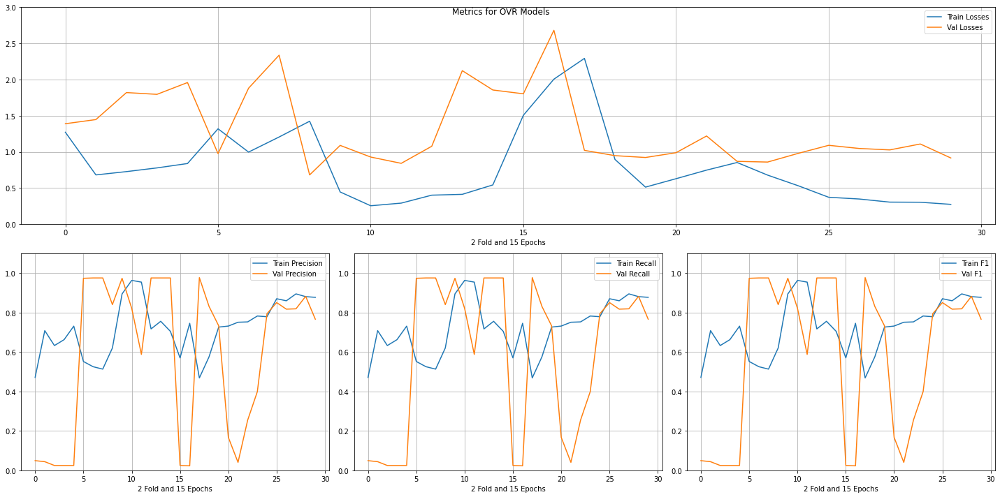

    train_f1  validation_f1  ...  train_losses  validation_losses
2   0.468421       0.977153  ...      2.293056           1.021189
6   0.525483       0.975439  ...      0.997278           1.880720
14  0.704745       0.975439  ...      0.543141           1.855996
13  0.755712       0.975439  ...      0.413216           2.123208
12  0.717047       0.975439  ...      0.401674           1.077931
7   0.513181       0.975439  ...      1.205941           2.337400
9   0.894552       0.973684  ...      0.445859           1.089774
5   0.551845       0.973684  ...      1.319525           0.975963
13  0.880702       0.882250  ...      0.303744           1.109285
10  0.870175       0.850615  ...      0.372554           1.090981
8   0.620387       0.840351  ...      1.424011           0.681648
3   0.575439       0.831283  ...      0.896021           0.948066
10  0.963093       0.821053  ...      0.255041           0.928787
12  0.894737       0.818981  ...      0.305510           1.027421
11  0.8596

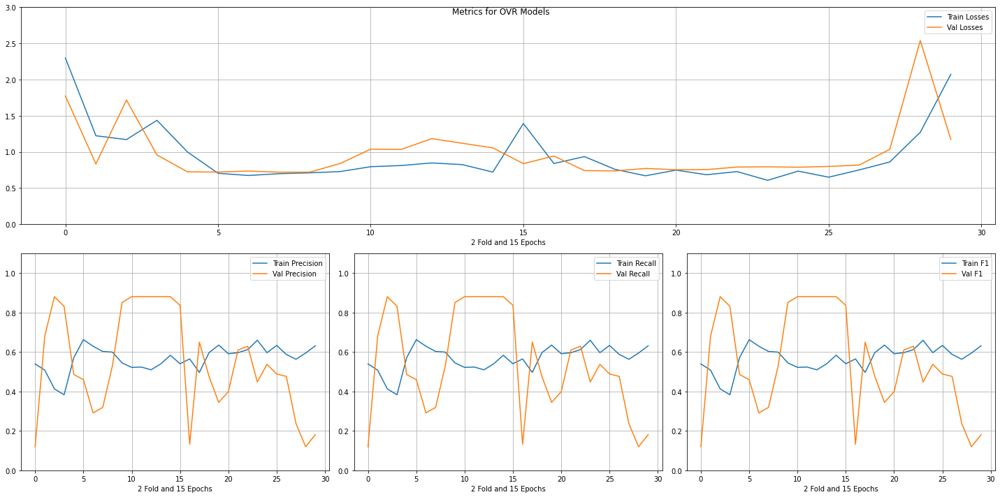

    train_f1  validation_f1  ...  train_losses  validation_losses
13  0.539543       0.880702  ...      0.824175           1.119301
2   0.413005       0.880702  ...      1.170495           1.717055
14  0.583480       0.880702  ...      0.720918           1.055683
12  0.509666       0.880702  ...      0.847134           1.183592
11  0.523726       0.880702  ...      0.811443           1.034163
10  0.521968       0.880702  ...      0.795226           1.037903
9   0.544815       0.850877  ...      0.728042           0.839231
0   0.540351       0.836555  ...      1.392187           0.837487
3   0.383128       0.831579  ...      1.436602           0.957581
1   0.507909       0.680702  ...      1.223010           0.833959
2   0.496491       0.650264  ...      0.934779           0.741063
7   0.612281       0.629174  ...      0.727577           0.790289
6   0.596491       0.609842  ...      0.684254           0.755289
9   0.596491       0.537786  ...      0.734041           0.787998
8   0.5992

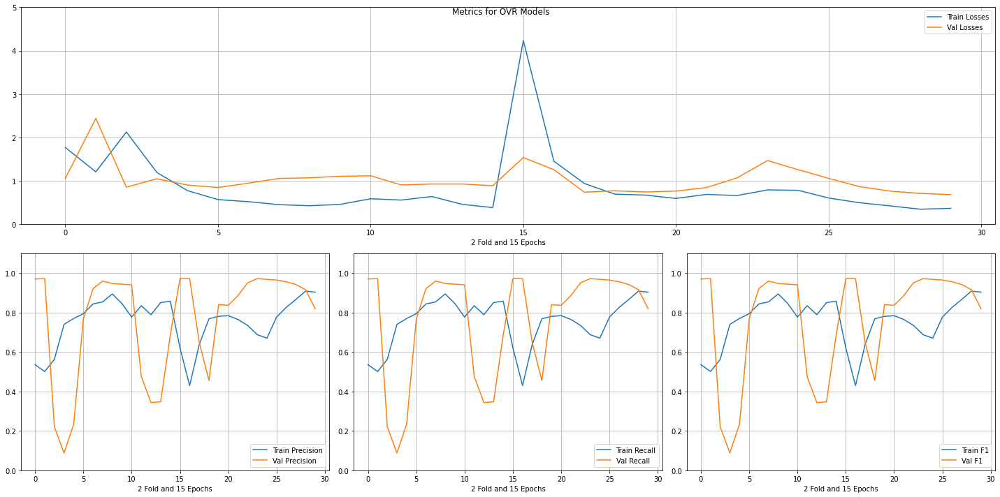

    train_f1  validation_f1  ...  train_losses  validation_losses
1   0.500879       0.971930  ...      1.207041           2.438046
0   0.621053       0.971880  ...      4.233657           1.534988
8   0.687719       0.971880  ...      0.791219           1.467313
1   0.429825       0.971880  ...      1.452288           1.257280
0   0.536028       0.970175  ...      1.769480           1.054303
9   0.670175       0.968366  ...      0.781219           1.256505
10  0.777193       0.964851  ...      0.603330           1.056874
7   0.854130       0.959649  ...      0.450705           1.055281
11  0.826316       0.956063  ...      0.495917           0.867620
7   0.735088       0.950791  ...      0.660316           1.068439
8   0.894552       0.947368  ...      0.425212           1.068954
9   0.845343       0.943860  ...      0.457123           1.105399
12  0.866667       0.942004  ...      0.423190           0.763839
10  0.776801       0.940351  ...      0.586583           1.116025
6   0.8435

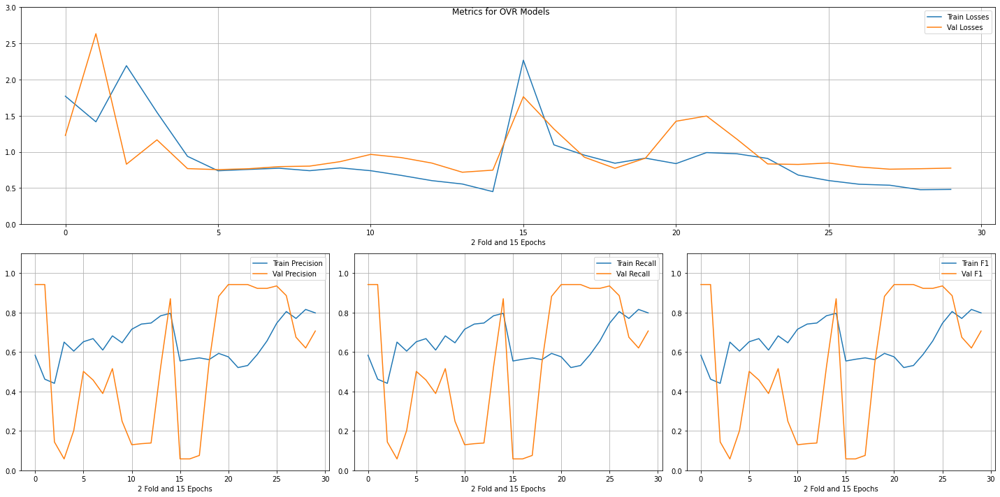

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.583480       0.942105  ...      1.770119           1.227705
1   0.462214       0.942105  ...      1.415864           2.634801
7   0.531579       0.942004  ...      0.973552           1.174042
6   0.521053       0.942004  ...      0.990676           1.496108
5   0.575439       0.942004  ...      0.837901           1.423844
10  0.745614       0.934974  ...      0.603341           0.846457
9   0.656140       0.922671  ...      0.679787           0.826510
8   0.587719       0.922671  ...      0.909434           0.833774
11  0.805263       0.885764  ...      0.552620           0.791503
4   0.592982       0.882250  ...      0.913421           0.913737
14  0.796134       0.870175  ...      0.450413           0.747661
14  0.798246       0.706503  ...      0.480931           0.775869
12  0.770175       0.674868  ...      0.539218           0.760792
13  0.815789       0.620387  ...      0.477045           0.767281
3   0.5614

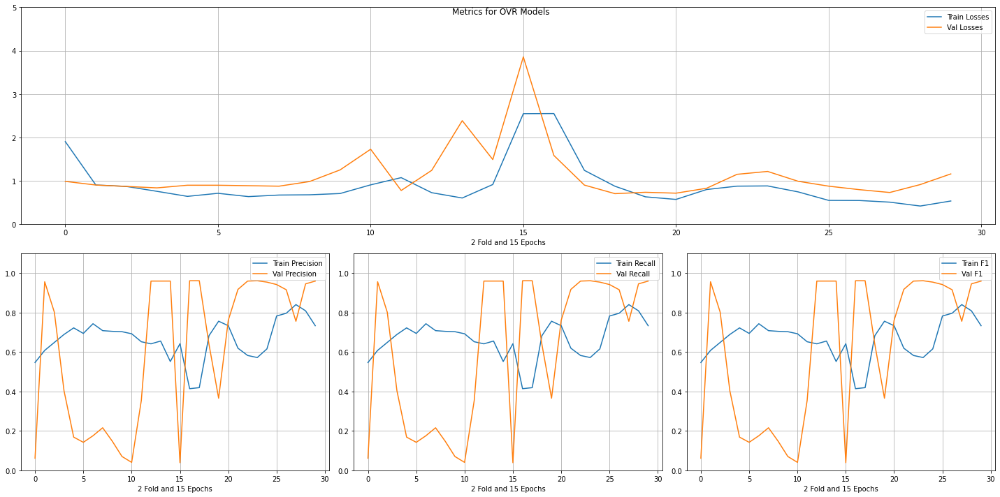

    train_f1  validation_f1  ...  train_losses  validation_losses
8   0.571930       0.961336  ...      0.882315           1.216463
2   0.419298       0.961336  ...      1.240982           0.901537
1   0.414035       0.961336  ...      2.550659           1.584947
13  0.655536       0.959649  ...      0.604051           2.386214
12  0.641476       0.959649  ...      0.726374           1.241284
14  0.551845       0.959649  ...      0.915049           1.490254
7   0.582456       0.959578  ...      0.877163           1.149930
14  0.733333       0.959578  ...      0.535106           1.159114
1   0.608084       0.956140  ...      0.903725           0.903055
9   0.615789       0.954306  ...      0.744822           0.989496
13  0.808772       0.945518  ...      0.418929           0.913875
10  0.782456       0.942004  ...      0.549088           0.877065
6   0.619298       0.917399  ...      0.799150           0.828243
11  0.796491       0.915641  ...      0.546524           0.796643
2   0.6485

In [27]:
jlabels = jle.transform(jle.classes_)
jovr_res = ovr_train_model(data, MfccMatrixJanakaRagaDataset, MfccRaga, "OVR Models", jlabels, jle.classes_, lbl_encoder=jle, target='JanakaRagamCode', lr=1e-5, epochs=15, n_folds=2)

# OVR Experiment without Mayamalavagowla Raga

In [28]:
cl = jle.classes_
mc = jle.transform(['Mayamalavagowla','Unknown'])
rdata = data[data['JanakaRagamCode']!=mc[0]]
rdata = rdata[rdata['JanakaRagamCode']!=mc[1]]
cl = [x for x in cl if not x in ['Mayamalavagowla','Unknown'] ]
jlabels1 = jle.transform(cl)

Training for ['Chalanata'] with 25 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 304/304
Class Weights : [ 0.52144082 12.16      ]
Epoch 1/15 : Training Loss: 2.268 / Validation Loss : 0.741 [Time Taken : 1.094426 seconds]
[[166 125]
 [ 10   3]]
[[291   1]
 [ 11   1]]
Epoch 2/15 : Training Loss: 0.900 / Validation Loss : 0.642 [Time Taken : 1.458414 seconds]
[[110 181]
 [  4   9]]
[[282  10]
 [ 11   1]]
Epoch 3/15 : Training Loss: 0.742 / Validation Loss : 1.165 [Time Taken : 0.891043 seconds]
[[272  19]
 [ 10   3]]
[[  0 292]
 [  0  12]]
Epoch 4/15 : Training Loss: 0.881 / Validation Loss : 0.653 [Time Taken : 0.905407 seconds]
[[143 148]
 [  8   5]]
[[257  35]
 [  9   3]]
Epoch 5/15 : Training Loss: 0.529 / Validation Loss : 0.809 [Time Taken : 0.886147 seconds]
[[242  49]
 [  5   8]]
[[ 41 251]
 [  0  12]]
Epoch 6/15 : Training Loss: 0.647 / Validation Loss : 0.708 [Time Taken : 0.893219 seconds]
[[232  59]
 [  6   7]]
[[121 171]
 [  3   9]]
Epoch 7/15 : Training Loss: 0.517 /

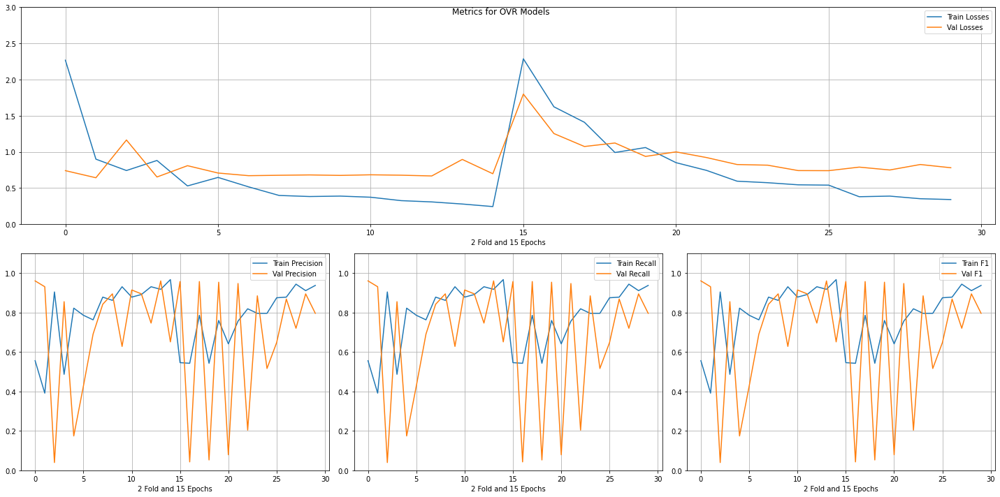

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.555921       0.960526  ...      2.268116           0.740753
13  0.917763       0.960526  ...      0.279168           0.895709
2   0.786184       0.957237  ...      1.409337           1.074549
0   0.546053       0.957237  ...      2.287088           1.799227
4   0.759868       0.953947  ...      1.060182           0.937395
6   0.756579       0.947368  ...      0.744072           0.921661
1   0.391447       0.930921  ...      0.899566           0.642408
10  0.878289       0.914474  ...      0.373134           0.683331
8   0.861842       0.894737  ...      0.382868           0.681508
11  0.891447       0.894737  ...      0.325782           0.677740
13  0.911184       0.894737  ...      0.352389           0.825642
8   0.796053       0.884868  ...      0.573915           0.816323
11  0.878289       0.868421  ...      0.380197           0.789513
3   0.486842       0.855263  ...      0.881295           0.652894
7   0.8782

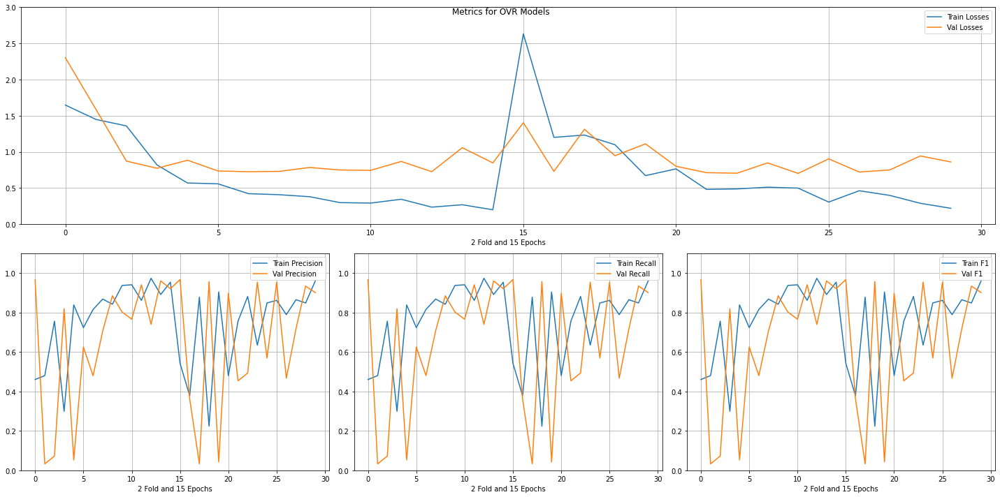

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.460526       0.967105  ...      1.647615           2.301175
0   0.542763       0.967105  ...      2.632477           1.403515
13  0.891447       0.960526  ...      0.269036           1.058099
3   0.223684       0.957237  ...      1.098953           0.947476
10  0.861842       0.953947  ...      0.306203           0.903720
8   0.634868       0.953947  ...      0.511862           0.847689
11  0.861842       0.940789  ...      0.345146           0.867811
13  0.848684       0.934211  ...      0.289436           0.943576
14  0.953947       0.921053  ...      0.199819           0.847773
14  0.960526       0.901316  ...      0.219858           0.861009
5   0.480263       0.898026  ...      0.765387           0.801015
8   0.842105       0.884868  ...      0.380166           0.784543
3   0.299342       0.819079  ...      0.819747           0.773750
9   0.937500       0.802632  ...      0.298495           0.749803
10  0.9407

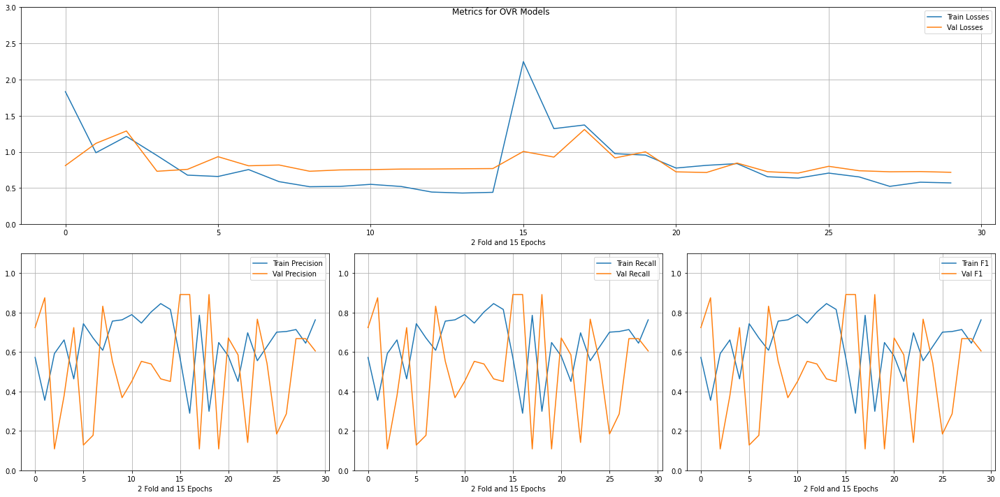

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.569079       0.891447  ...      2.248742           1.006311
3   0.299342       0.891447  ...      0.975323           0.916610
1   0.289474       0.891447  ...      1.321538           0.928183
1   0.355263       0.875000  ...      0.988734           1.117945
7   0.608553       0.832237  ...      0.588468           0.818741
8   0.555921       0.766447  ...      0.656211           0.725803
0   0.572368       0.723684  ...      1.833060           0.810692
4   0.463816       0.723684  ...      0.678586           0.758746
5   0.578947       0.671053  ...      0.776657           0.723966
13  0.644737       0.667763  ...      0.580845           0.727993
12  0.713816       0.667763  ...      0.523335           0.725065
14  0.763158       0.605263  ...      0.571114           0.717823
6   0.450658       0.585526  ...      0.814101           0.715399
11  0.746711       0.552632  ...      0.521611           0.762335
8   0.7565

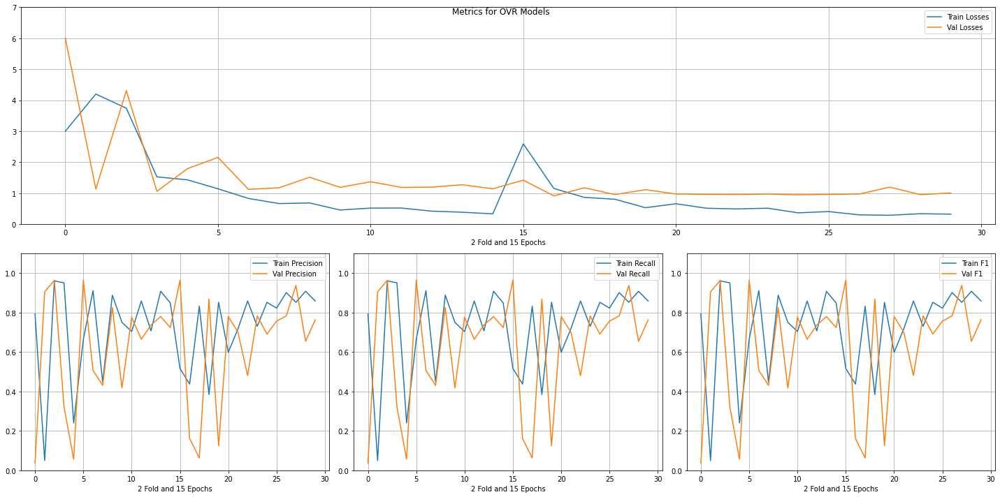

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.516447       0.963816  ...      2.592304           1.421009
2   0.960526       0.963816  ...      3.743403           4.308536
5   0.664474       0.963816  ...      1.142673           2.156067
12  0.851974       0.937500  ...      0.289253           1.196704
1   0.049342       0.904605  ...      4.200216           1.136461
3   0.384868       0.868421  ...      0.805359           0.955581
8   0.888158       0.825658  ...      0.685649           1.515743
11  0.901316       0.782895  ...      0.301302           0.973323
8   0.730263       0.782895  ...      0.516862           0.971632
13  0.907895       0.779605  ...      0.386473           1.273687
5   0.598684       0.779605  ...      0.659954           0.974122
10  0.703947       0.776316  ...      0.520352           1.369190
14  0.858553       0.763158  ...      0.324542           1.006592
10  0.822368       0.756579  ...      0.407408           0.962091
12  0.7072

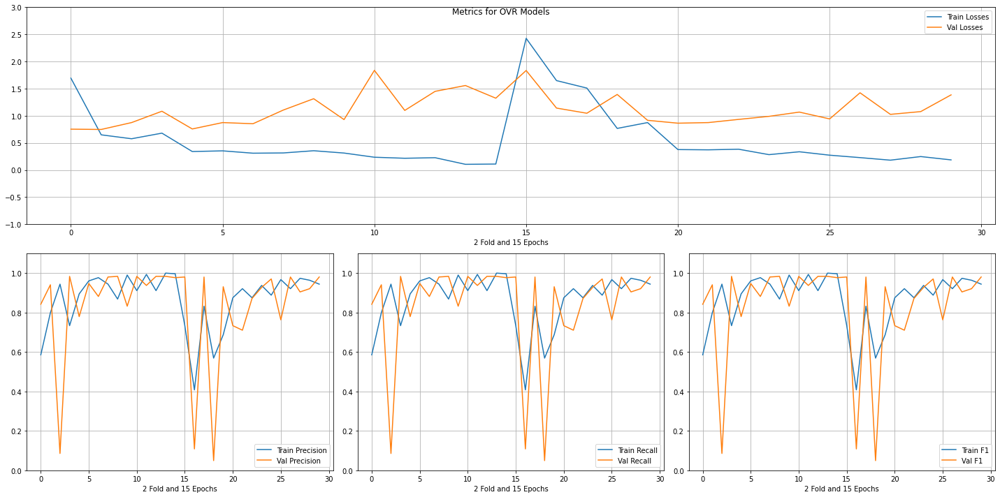

    train_f1  validation_f1  ...  train_losses  validation_losses
8   0.868421       0.983553  ...      0.354662           1.313703
3   0.733553       0.983553  ...      0.678975           1.082893
13  1.000000       0.983553  ...      0.104239           1.557024
12  0.911184       0.983553  ...      0.226268           1.449576
10  0.911184       0.983553  ...      0.235079           1.836549
0   0.733553       0.980263  ...      2.427052           1.833895
11  0.921053       0.980263  ...      0.227876           1.423043
2   0.832237       0.980263  ...      1.509995           1.045980
14  0.944079       0.980263  ...      0.185892           1.384610
7   0.944079       0.980263  ...      0.313967           1.105025
14  0.996711       0.976974  ...      0.109388           1.323595
9   0.888158       0.970395  ...      0.335687           1.067238
5   0.960526       0.947368  ...      0.352410           0.873839
1   0.799342       0.940789  ...      0.647824           0.746888
11  0.9934

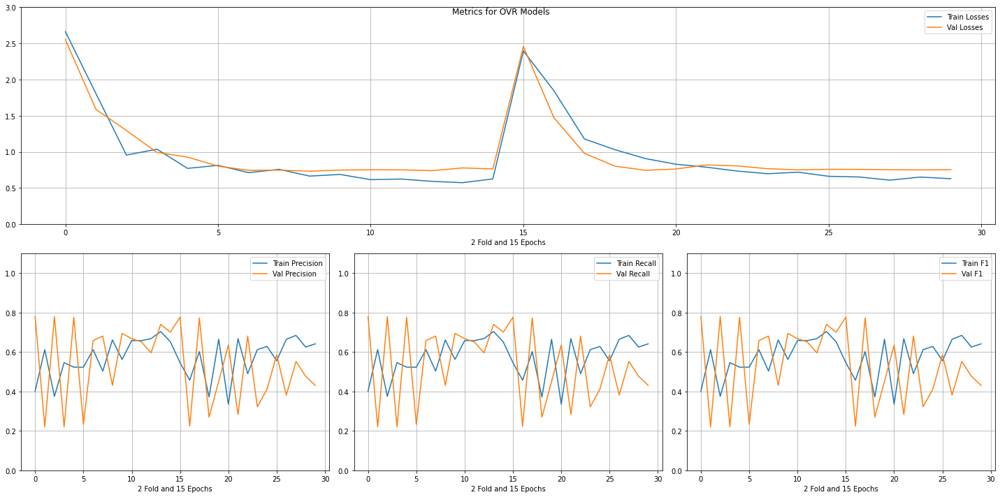

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.401316       0.779605  ...      2.663082           2.552045
2   0.375000       0.779605  ...      0.955947           1.295460
4   0.523026       0.776316  ...      0.772148           0.927859
0   0.546053       0.776316  ...      2.395881           2.456984
2   0.601974       0.773026  ...      1.178429           0.979832
13  0.703947       0.740132  ...      0.574115           0.778468
14  0.651316       0.700658  ...      0.626115           0.764597
9   0.562500       0.694079  ...      0.688067           0.748944
7   0.503289       0.680921  ...      0.758777           0.748344
7   0.490132       0.680921  ...      0.735132           0.805938
10  0.657895       0.667763  ...      0.615859           0.752679
6   0.611842       0.657895  ...      0.712945           0.744852
11  0.657895       0.651316  ...      0.624521           0.751856
5   0.335526       0.634868  ...      0.829311           0.763689
12  0.6677

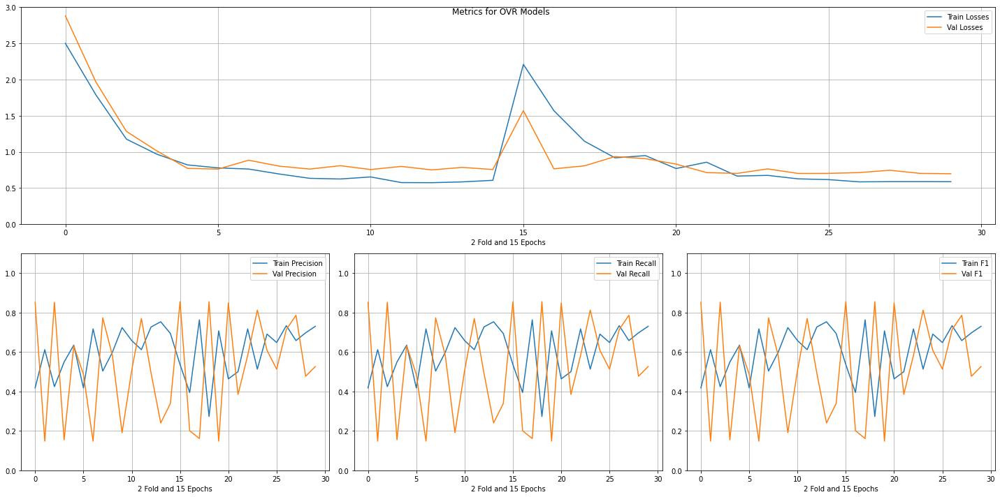

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.536184       0.855263  ...      2.209827           1.570386
3   0.273026       0.855263  ...      0.917779           0.935240
0   0.417763       0.851974  ...      2.500825           2.881819
2   0.424342       0.851974  ...      1.176398           1.282939
5   0.463816       0.848684  ...      0.769935           0.831614
8   0.513158       0.812500  ...      0.675239           0.764808
12  0.657895       0.786184  ...      0.588507           0.745941
7   0.503289       0.773026  ...      0.694687           0.803341
11  0.611842       0.769737  ...      0.575745           0.799173
11  0.733553       0.713816  ...      0.585662           0.714051
4   0.634868       0.631579  ...      0.820217           0.772344
9   0.690789       0.608553  ...      0.627203           0.701954
7   0.717105       0.582237  ...      0.665673           0.702560
8   0.598684       0.582237  ...      0.634650           0.762578
14  0.7302

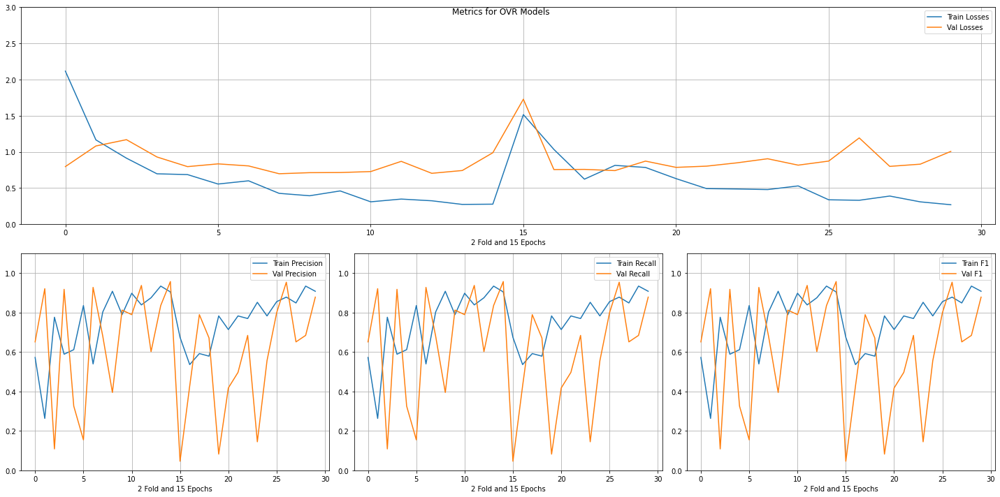

    train_f1  validation_f1  ...  train_losses  validation_losses
14  0.904605       0.957237  ...      0.277201           0.988433
11  0.878289       0.953947  ...      0.330927           1.193136
11  0.838816       0.937500  ...      0.347648           0.869102
6   0.539474       0.927632  ...      0.600164           0.806069
1   0.263158       0.921053  ...      1.165886           1.081790
3   0.588816       0.917763  ...      0.696990           0.929586
14  0.907895       0.878289  ...      0.269388           1.006664
13  0.934211       0.835526  ...      0.273790           0.742539
9   0.789474       0.812500  ...      0.460252           0.714639
10  0.855263       0.799342  ...      0.337658           0.872843
10  0.898026       0.789474  ...      0.309762           0.727932
2   0.592105       0.789474  ...      0.622892           0.758118
7   0.769737       0.684211  ...      0.486962           0.848895
13  0.934211       0.684211  ...      0.309139           0.830394
7   0.8026

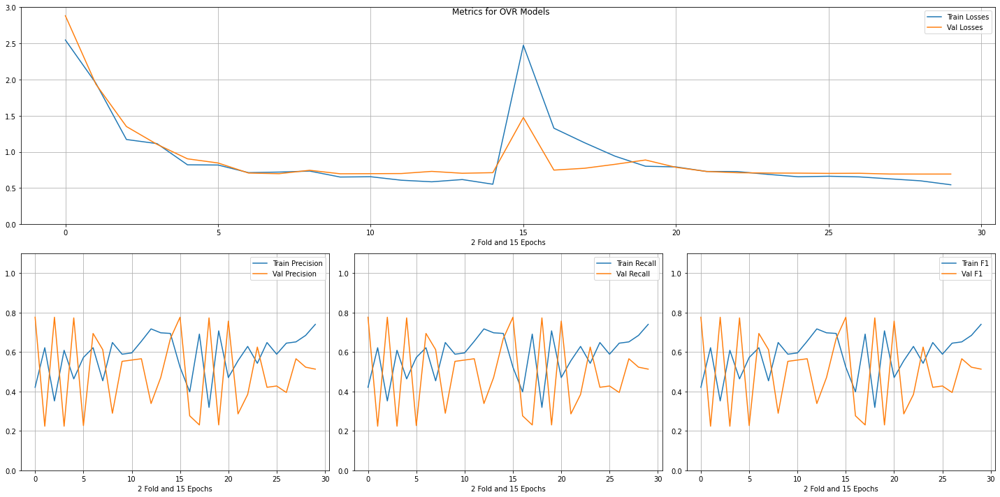

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.421053       0.776316  ...      2.547703           2.883000
2   0.351974       0.776316  ...      1.171350           1.350668
0   0.523026       0.776316  ...      2.474547           1.475785
3   0.319079       0.773026  ...      0.941243           0.828214
4   0.463816       0.773026  ...      0.821300           0.904066
5   0.470395       0.756579  ...      0.792167           0.786327
6   0.621711       0.694079  ...      0.713116           0.707532
14  0.694079       0.667763  ...      0.552928           0.712772
8   0.542763       0.625000  ...      0.689730           0.707633
7   0.453947       0.611842  ...      0.721008           0.698698
12  0.651316       0.565789  ...      0.627256           0.693803
11  0.654605       0.565789  ...      0.608389           0.700670
10  0.595395       0.559211  ...      0.656509           0.698904
9   0.588816       0.552632  ...      0.652354           0.697341
13  0.6842

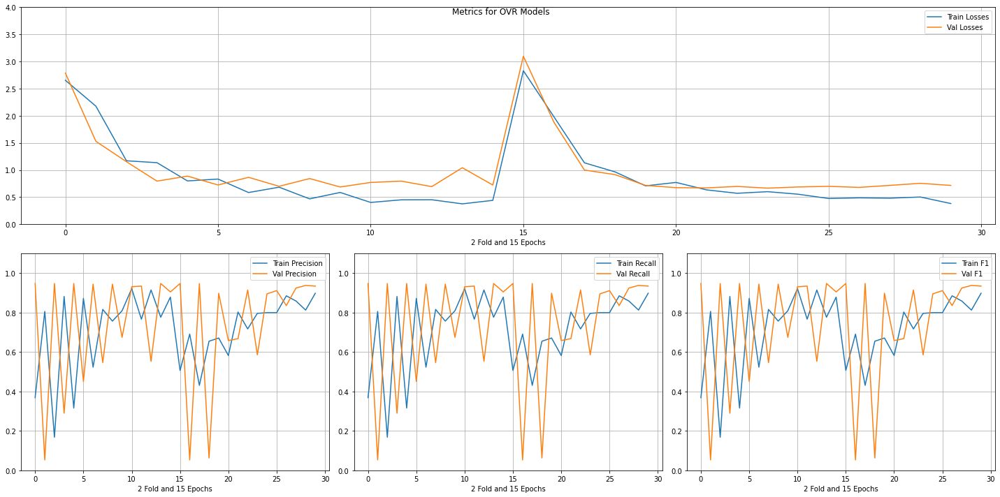

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.368421       0.947368  ...      2.653855           2.786930
4   0.315789       0.947368  ...      0.797860           0.886747
2   0.430921       0.947368  ...      1.131965           0.998503
13  0.776316       0.947368  ...      0.375399           1.041533
0   0.506579       0.947368  ...      2.829820           3.097274
2   0.167763       0.947368  ...      1.169575           1.152415
8   0.756579       0.944079  ...      0.467255           0.841969
6   0.523026       0.944079  ...      0.584041           0.864684
13  0.812500       0.937500  ...      0.501796           0.753801
11  0.766447       0.934211  ...      0.449532           0.794118
14  0.898026       0.934211  ...      0.381085           0.715216
10  0.921053       0.930921  ...      0.401358           0.769961
12  0.858553       0.924342  ...      0.479677           0.715731
7   0.717105       0.914474  ...      0.570198           0.696405
10  0.7993

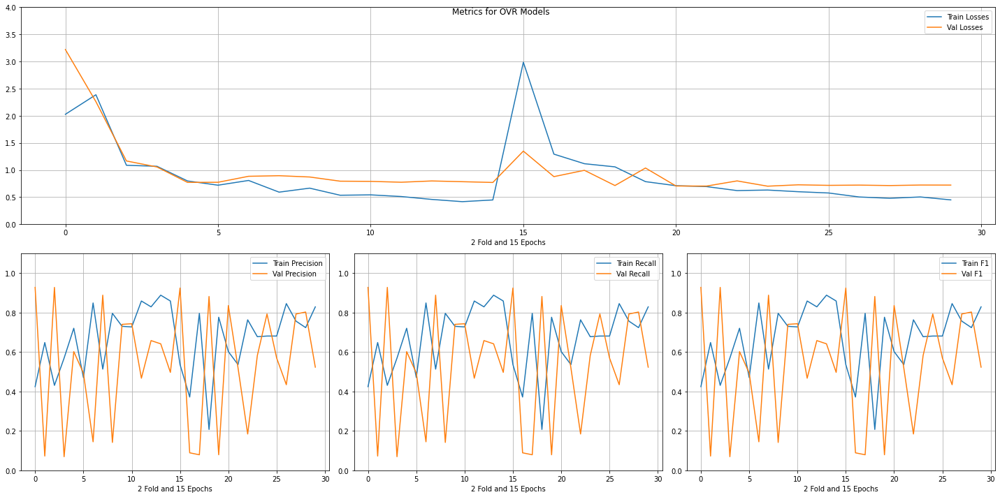

    train_f1  validation_f1  ...  train_losses  validation_losses
0   0.424342       0.927632  ...      2.026485           3.220626
2   0.430921       0.927632  ...      1.086533           1.166047
0   0.536184       0.924342  ...      2.986512           1.347702
7   0.513158       0.888158  ...      0.591081           0.894244
3   0.207237       0.881579  ...      1.057359           0.713128
5   0.601974       0.835526  ...      0.710003           0.704416
13  0.723684       0.802632  ...      0.502519           0.722272
9   0.680921       0.792763  ...      0.599214           0.726399
12  0.756579       0.792763  ...      0.478074           0.712824
10  0.726974       0.743421  ...      0.541161           0.789690
9   0.730263       0.740132  ...      0.534094           0.793309
12  0.828947       0.657895  ...      0.457177           0.797488
13  0.888158       0.641447  ...      0.415826           0.783870
4   0.720395       0.601974  ...      0.797602           0.770927
8   0.6776

In [29]:
jovr_res_reduced = ovr_train_model(rdata, MfccMatrixJanakaRagaDataset, MfccRaga, "OVR Models", jlabels1, cl, lbl_encoder=jle, target='JanakaRagamCode', 
                                   lr=1e-5, epochs=15, n_folds=2)

# OVR Experiment 2 - LSTM Model

In [31]:
class MfccLstmModel(nn.Module):
    def __init__(self, n_labels, dropout=0.25, n_layers=2):
        super().__init__()
        self.input_dim = 40
        self.hidden_dim = self.input_dim
        self.n_layers = n_layers
        self.seq_len = 7501
        self.n_labels = n_labels
        self.rnn = nn.LSTM(self.input_dim, self.hidden_dim, self.n_layers, batch_first=True, bidirectional=True, dropout=dropout)
        self.fc = nn.Sequential(nn.Linear(2*self.hidden_dim,160),
                                nn.GELU(),
                                nn.Linear(160,self.n_labels))

    def forward(self,x,h):
        x = x.reshape((x.shape[0],x.shape[2],x.shape[3]))
        out, (hn, cn) = self.rnn(x.permute(0, 2, 1), h)
        x_forward = out[range(len(out)), self.seq_len - 1, :self.hidden_dim]
        x_reverse = out[:, 0, self.hidden_dim:]
        x = torch.cat((x_forward, x_reverse), 1)
        x = self.fc(x)
        return x
    
    def init_hidden(self, batch_size, target_device):
        weight = next(self.parameters()).data
        # Bi directional LSTM
        hidden = (weight.new(2 * self.n_layers, batch_size, self.hidden_dim).zero_().to(target_device),
                  weight.new(2 * self.n_layers, batch_size, self.hidden_dim).zero_().to(target_device))
        return hidden

In [35]:
def ovr_train_model_lstm(data, dataset, mdl, title, labels, label_classes, lbl_encoder=None, target='RagamCode', feature='mfcc', lr=1e-4):
  results = {}
  for i in labels:
    # Create new data    
    nsamples = data[data[target]==i].shape[0]
    if lbl_encoder: print(f'Training for {lbl_encoder.inverse_transform([i])} with {nsamples} positive samples')
    ndata = pd.DataFrame()
    ndata[target] = data.apply(lambda x:1 if x[target] == i else 0, axis=1)
    ndata[feature] = data[feature]
    results[i] = train_model(ndata, dataset.prepare_data, gpu, 
                                  **{'n_labels' : 2,
                                   'report' : 50,
                                   'lstm' : True,
                                   'lr' : lr,
                                   'clip_at' : None,
                                   'k_folds' : 5,
                                   'balance_classes' : True,
                                   'dropout' : 0.1,
                                   'title' : title,
                                   'plot' : True,
                                   'epochs' : 10,
                                   'model' : mdl,
                                   'feature' : feature,
                                   'target' : target})
    print(results_to_df(results[i]))
  return results

Training for ['Chalanata'] with 25 positive samples
FOLD 1 
 Data Sizes (Train/Test) : 486/122
Class Weights : [ 0.52144082 12.16      ]
Epoch 1/10 : Training Loss: 0.693 / Validation Loss : 0.695 [Time Taken : 11.138952 seconds]
[[ 14 452]
 [  0  20]]
[[  1 116]
 [  2   3]]
Epoch 2/10 : Training Loss: 0.692 / Validation Loss : 0.695 [Time Taken : 11.106175 seconds]
[[ 21 445]
 [  0  20]]
[[  1 116]
 [  2   3]]
Epoch 3/10 : Training Loss: 0.693 / Validation Loss : 0.695 [Time Taken : 11.106445 seconds]
[[ 24 442]
 [  1  19]]
[[  1 116]
 [  2   3]]
Epoch 4/10 : Training Loss: 0.693 / Validation Loss : 0.695 [Time Taken : 11.109525 seconds]
[[ 22 444]
 [  1  19]]
[[  2 115]
 [  2   3]]
Epoch 5/10 : Training Loss: 0.692 / Validation Loss : 0.695 [Time Taken : 11.070246 seconds]
[[ 29 437]
 [  1  19]]
[[  4 113]
 [  2   3]]
Epoch 6/10 : Training Loss: 0.691 / Validation Loss : 0.695 [Time Taken : 11.116307 seconds]
[[ 35 431]
 [  1  19]]
[[  4 113]
 [  2   3]]
Epoch 7/10 : Training Loss: 0

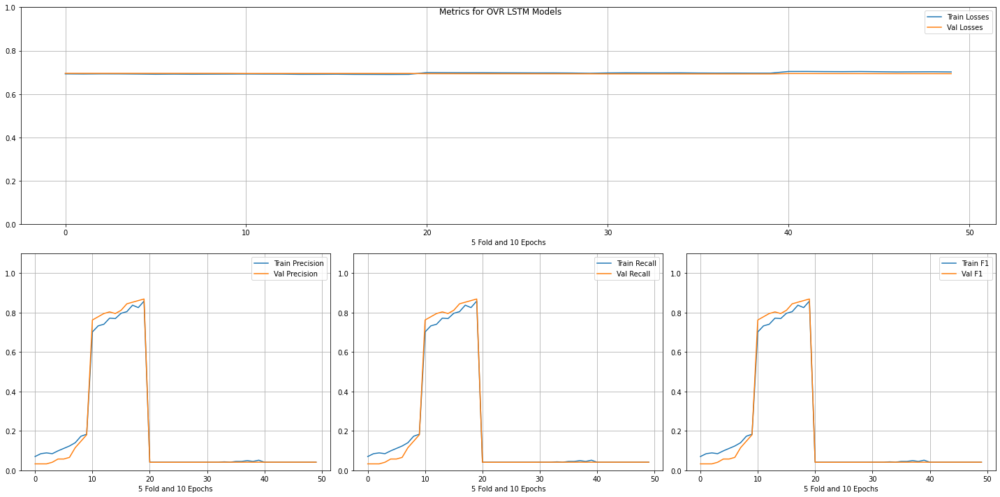

   train_f1  validation_f1  ...  train_losses  validation_losses
9  0.858025       0.868852  ...      0.690888           0.694965
8  0.825103       0.860656  ...      0.690492           0.694947
7  0.837449       0.852459  ...      0.690730           0.694923
6  0.804527       0.844262  ...      0.690889           0.694899
5  0.796296       0.811475  ...      0.691670           0.694875
3  0.771605       0.803279  ...      0.691119           0.694835
4  0.769547       0.795082  ...      0.691277           0.694855
2  0.740741       0.795082  ...      0.692020           0.694819
1  0.732510       0.778689  ...      0.692101           0.694801
0  0.701646       0.762295  ...      0.692453           0.694788
9  0.183128       0.180328  ...      0.692030           0.695265
8  0.172840       0.147541  ...      0.691786           0.695281
7  0.139918       0.114754  ...      0.691491           0.695297
6  0.123457       0.065574  ...      0.691950           0.695315
5  0.111111       0.05737

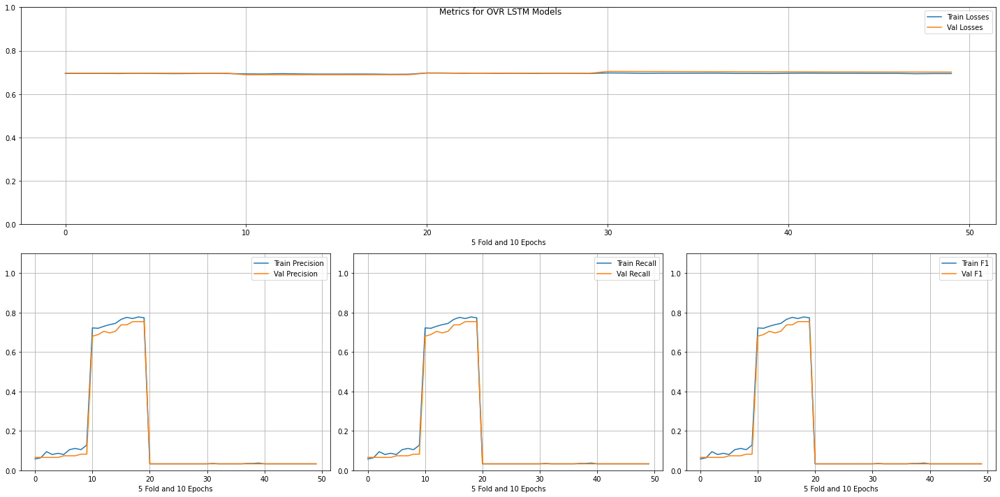

   train_f1  validation_f1  ...  train_losses  validation_losses
7  0.769547       0.754098  ...      0.691941           0.689092
9  0.773663       0.754098  ...      0.691395           0.689156
8  0.777778       0.754098  ...      0.690916           0.689124
6  0.775720       0.737705  ...      0.692245           0.689051
5  0.765432       0.737705  ...      0.691995           0.689009
2  0.730453       0.704918  ...      0.694001           0.688880
4  0.744856       0.704918  ...      0.691918           0.688970
3  0.738683       0.696721  ...      0.692725           0.688925
1  0.720165       0.688525  ...      0.692429           0.688839
0  0.722222       0.680328  ...      0.692772           0.688798
8  0.104938       0.081967  ...      0.695239           0.695849
9  0.127572       0.081967  ...      0.694447           0.695787
5  0.080247       0.073770  ...      0.694689           0.696047
6  0.104938       0.073770  ...      0.694166           0.695977
7  0.111111       0.07377

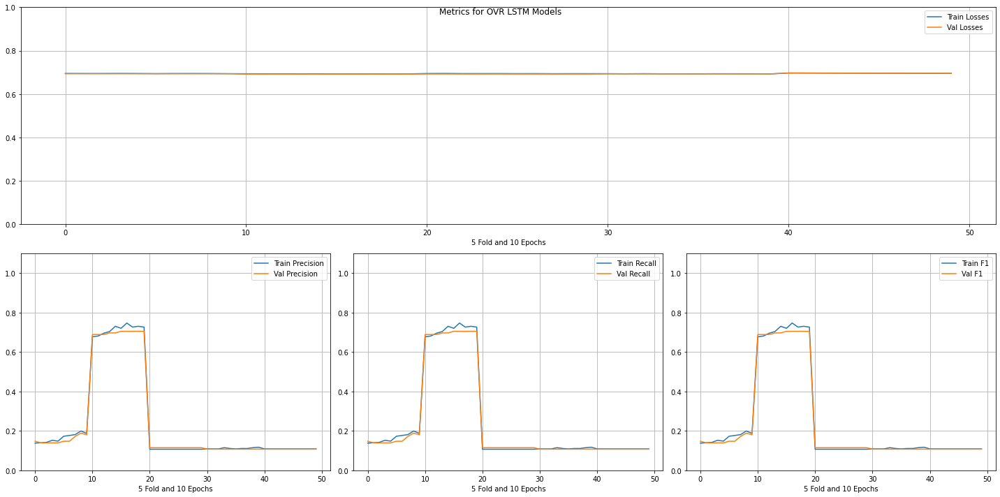

   train_f1  validation_f1  ...  train_losses  validation_losses
9  0.726337       0.704918  ...      0.692998           0.692195
8  0.730453       0.704918  ...      0.692630           0.692192
7  0.726337       0.704918  ...      0.692950           0.692187
6  0.746914       0.704918  ...      0.693155           0.692176
5  0.720165       0.704918  ...      0.693000           0.692167
3  0.703704       0.696721  ...      0.693260           0.692144
4  0.730453       0.696721  ...      0.693341           0.692155
2  0.695473       0.688525  ...      0.693359           0.692137
0  0.676955       0.688525  ...      0.693471           0.692119
1  0.681070       0.688525  ...      0.693409           0.692130
8  0.199588       0.188525  ...      0.694541           0.693366
9  0.187243       0.180328  ...      0.693904           0.693357
7  0.181070       0.172131  ...      0.694724           0.693380
0  0.137860       0.147541  ...      0.694895           0.693510
6  0.176955       0.14754

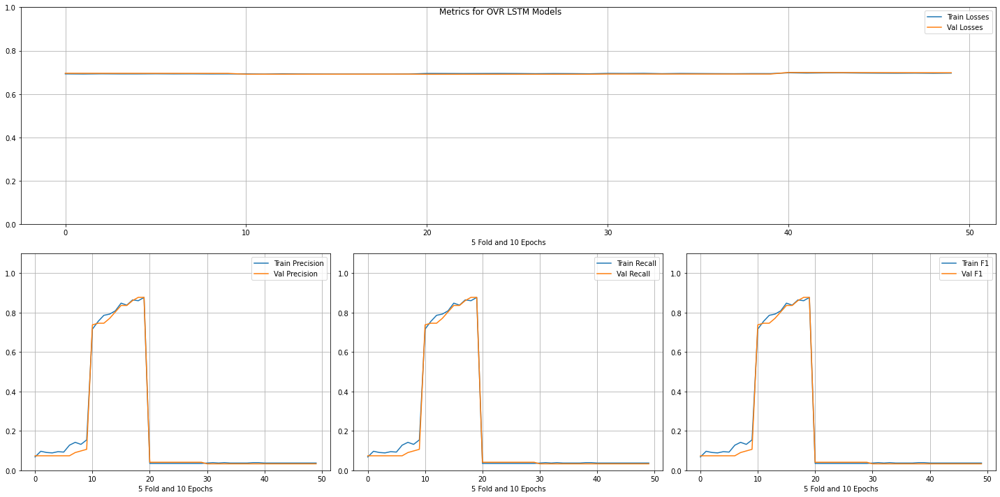

   train_f1  validation_f1  ...  train_losses  validation_losses
9  0.876543       0.877049  ...      0.692262           0.691864
8  0.860082       0.877049  ...      0.691942           0.691812
7  0.864198       0.860656  ...      0.691933           0.691763
6  0.837449       0.836066  ...      0.691974           0.691712
5  0.847737       0.836066  ...      0.691949           0.691663
4  0.808642       0.803279  ...      0.692193           0.691613
3  0.792181       0.770492  ...      0.692547           0.691562
2  0.786008       0.745902  ...      0.693302           0.691511
1  0.755144       0.745902  ...      0.691914           0.691461
0  0.716049       0.737705  ...      0.692781           0.691412
9  0.154321       0.106557  ...      0.692733           0.695145
8  0.131687       0.098361  ...      0.692626           0.695202
7  0.141975       0.090164  ...      0.693028           0.695263
0  0.067901       0.073770  ...      0.692924           0.695732
1  0.096708       0.07377

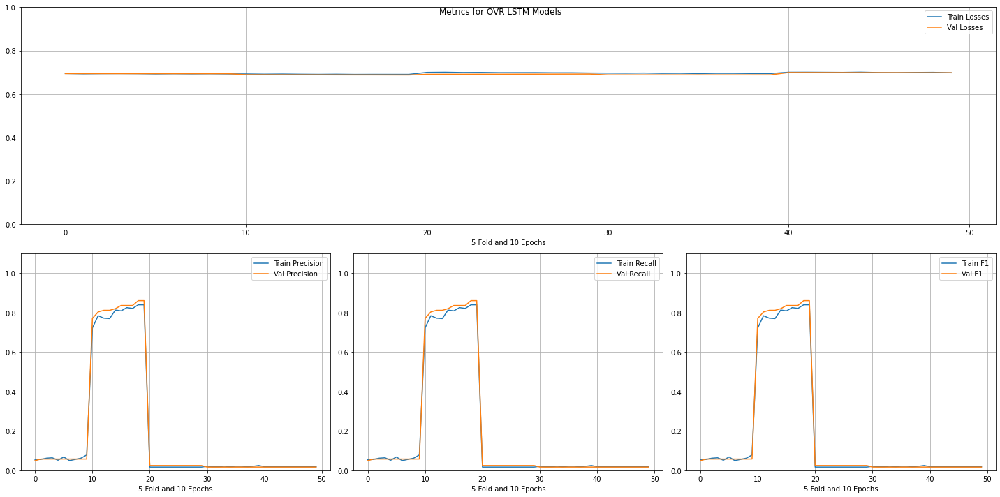

   train_f1  validation_f1  ...  train_losses  validation_losses
8  0.839506       0.860656  ...      0.690556           0.687991
9  0.839506       0.860656  ...      0.690524           0.687853
7  0.820988       0.836066  ...      0.690606           0.688133
6  0.825103       0.836066  ...      0.690386           0.688159
5  0.808642       0.836066  ...      0.691206           0.688273
4  0.812757       0.819672  ...      0.690646           0.688415
3  0.769547       0.811475  ...      0.691177           0.688556
2  0.771605       0.811475  ...      0.692044           0.688703
1  0.783951       0.803279  ...      0.691434           0.688857
0  0.722222       0.770492  ...      0.692411           0.689052
8  0.061728       0.057377  ...      0.693458           0.693868
7  0.055556       0.057377  ...      0.692966           0.693909
1  0.055556       0.057377  ...      0.693193           0.694241
6  0.049383       0.057377  ...      0.693557           0.693966
5  0.067901       0.05737

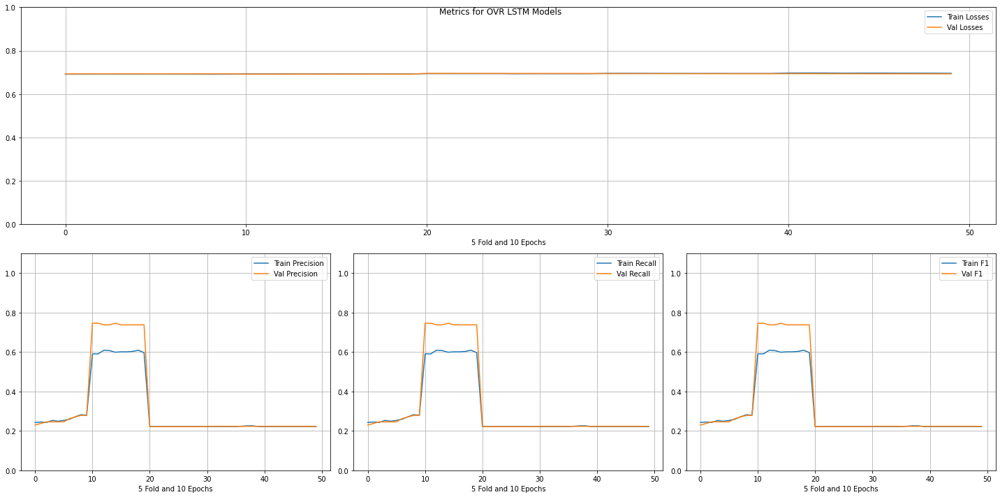

   train_f1  validation_f1  ...  train_losses  validation_losses
4  0.598765       0.745902  ...      0.693019           0.691884
1  0.590535       0.745902  ...      0.693064           0.691938
0  0.590535       0.745902  ...      0.693382           0.691954
7  0.602881       0.737705  ...      0.692778           0.691836
9  0.596708       0.737705  ...      0.692783           0.691806
6  0.600823       0.737705  ...      0.692679           0.691851
5  0.600823       0.737705  ...      0.692915           0.691867
3  0.606996       0.737705  ...      0.692891           0.691902
2  0.609053       0.737705  ...      0.693296           0.691919
8  0.609053       0.737705  ...      0.692413           0.691821
8  0.281893       0.278689  ...      0.692059           0.693239
9  0.279835       0.278689  ...      0.692201           0.693245
7  0.271605       0.270492  ...      0.692371           0.693233
6  0.259259       0.262295  ...      0.692674           0.693226
5  0.253086       0.24590

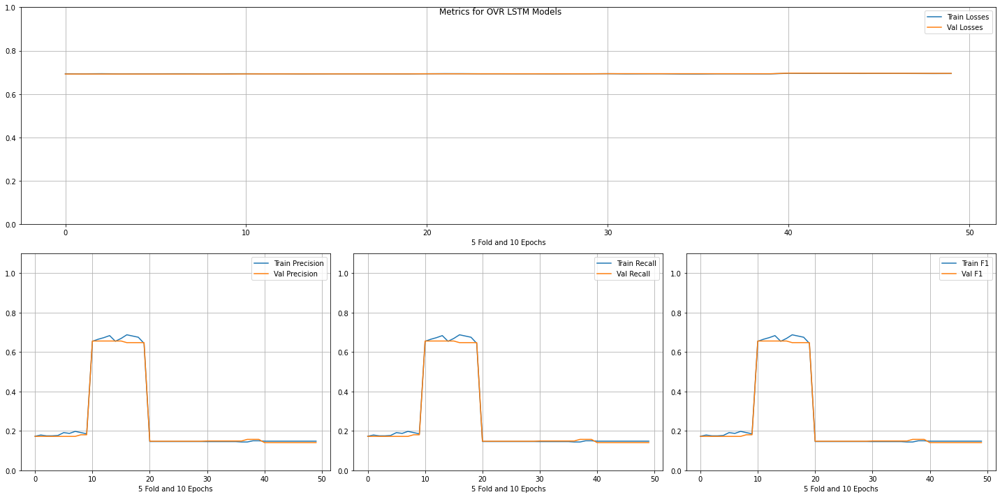

   train_f1  validation_f1  ...  train_losses  validation_losses
5  0.668724       0.655738  ...      0.693158           0.692782
3  0.683128       0.655738  ...      0.692679           0.692774
4  0.654321       0.655738  ...      0.692883           0.692778
0  0.654321       0.655738  ...      0.693549           0.692754
1  0.664609       0.655738  ...      0.693200           0.692762
2  0.672840       0.655738  ...      0.693254           0.692768
9  0.644033       0.647541  ...      0.692844           0.692805
8  0.674897       0.647541  ...      0.692987           0.692797
7  0.681070       0.647541  ...      0.693046           0.692791
6  0.687243       0.647541  ...      0.693119           0.692785
8  0.191358       0.180328  ...      0.692822           0.692238
9  0.185185       0.180328  ...      0.693387           0.692226
1  0.179012       0.172131  ...      0.693071           0.692293
0  0.172840       0.172131  ...      0.693436           0.692302
7  0.197531       0.17213

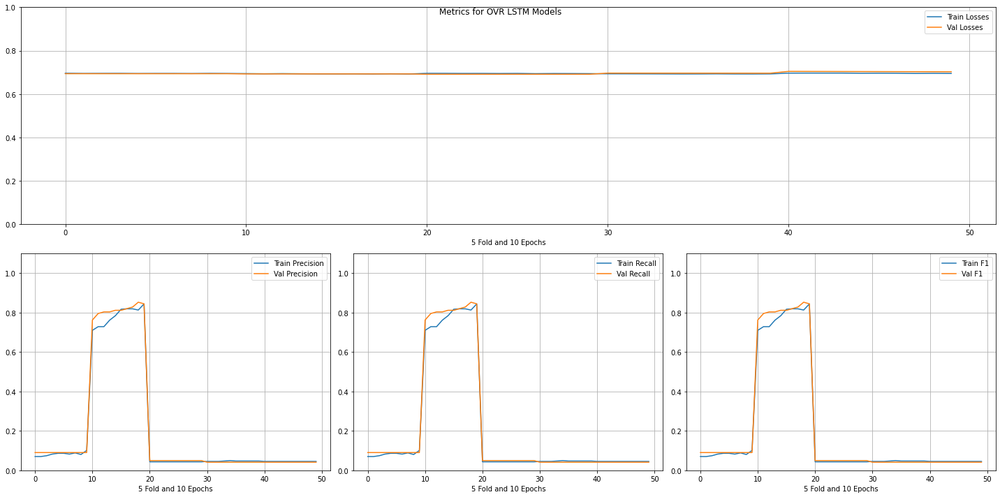

   train_f1  validation_f1  ...  train_losses  validation_losses
8  0.812757       0.852459  ...      0.693351           0.692716
9  0.843621       0.844262  ...      0.692351           0.692707
7  0.818930       0.827869  ...      0.692566           0.692730
6  0.818930       0.819672  ...      0.693138           0.692742
5  0.816872       0.811475  ...      0.692866           0.692758
4  0.783951       0.811475  ...      0.692950           0.692775
2  0.728395       0.803279  ...      0.694121           0.692793
3  0.761317       0.803279  ...      0.693401           0.692787
1  0.728395       0.795082  ...      0.693341           0.692796
0  0.709877       0.762295  ...      0.694242           0.692796
1  0.069959       0.090164  ...      0.694860           0.693875
0  0.069959       0.090164  ...      0.695837           0.693895
9  0.100823       0.090164  ...      0.694791           0.693818
8  0.080247       0.090164  ...      0.695231           0.693825
7  0.088477       0.09016

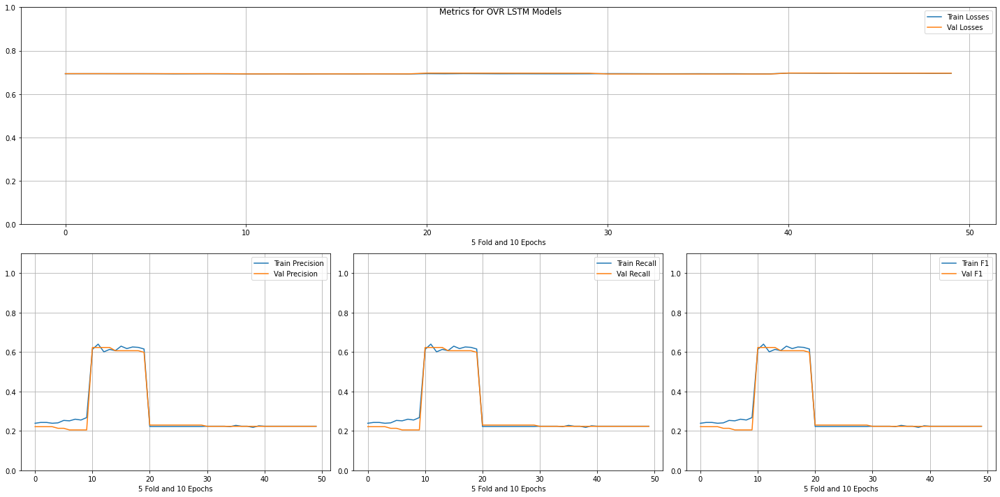

   train_f1  validation_f1  ...  train_losses  validation_losses
0  0.613169       0.622951  ...      0.692904           0.692766
3  0.613169       0.622951  ...      0.692689           0.692801
2  0.600823       0.622951  ...      0.693210           0.692789
1  0.639918       0.622951  ...      0.692912           0.692775
7  0.625514       0.606557  ...      0.693193           0.692858
6  0.617284       0.606557  ...      0.692829           0.692843
5  0.629630       0.606557  ...      0.693120           0.692828
4  0.606996       0.606557  ...      0.693093           0.692814
8  0.623457       0.606557  ...      0.692877           0.692870
9  0.615226       0.598361  ...      0.692505           0.692883
2  0.222222       0.229508  ...      0.694048           0.696324
3  0.222222       0.229508  ...      0.693748           0.696247
4  0.222222       0.229508  ...      0.693342           0.696172
6  0.222222       0.229508  ...      0.693263           0.696027
7  0.222222       0.22950

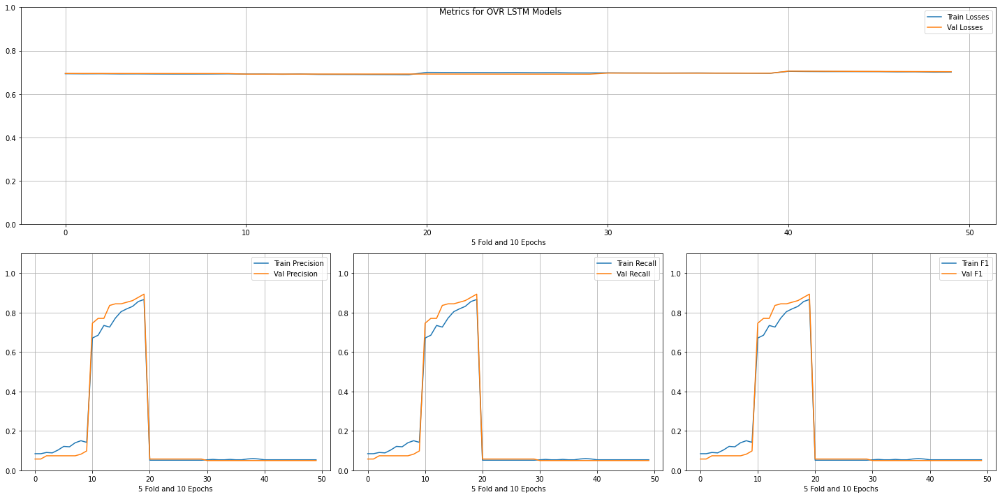

   train_f1  validation_f1  ...  train_losses  validation_losses
9  0.866255       0.893443  ...      0.689036           0.692237
8  0.855967       0.877049  ...      0.689605           0.692187
7  0.831276       0.860656  ...      0.689840           0.692143
6  0.818930       0.852459  ...      0.690257           0.692102
5  0.804527       0.844262  ...      0.690393           0.692059
4  0.771605       0.844262  ...      0.690577           0.692012
3  0.726337       0.836066  ...      0.691993           0.691967
1  0.685185       0.770492  ...      0.692092           0.691884
2  0.734568       0.770492  ...      0.691224           0.691924
0  0.670782       0.745902  ...      0.691944           0.691842
9  0.141975       0.098361  ...      0.693020           0.694348
8  0.150206       0.081967  ...      0.692450           0.694394
7  0.139918       0.073770  ...      0.692273           0.694441
6  0.119342       0.073770  ...      0.692231           0.694486
5  0.121399       0.07377

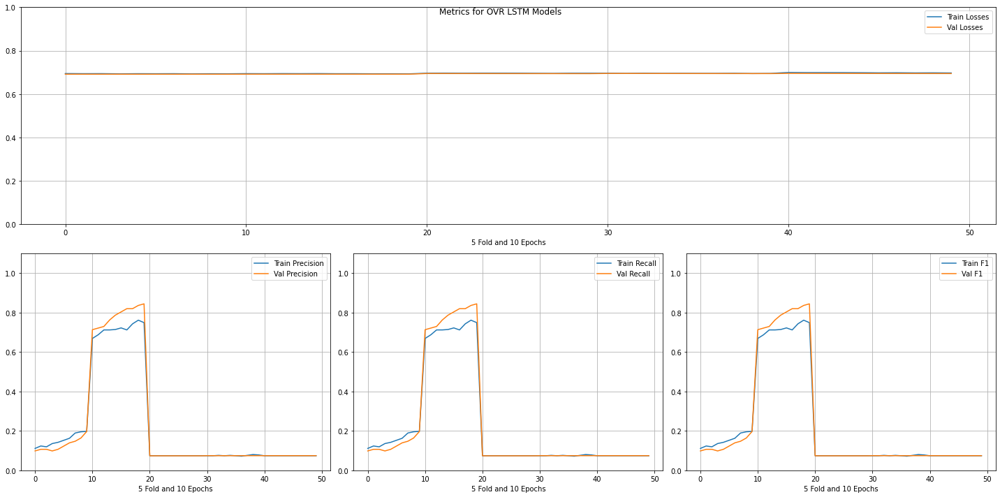

   train_f1  validation_f1  ...  train_losses  validation_losses
9  0.748971       0.844262  ...      0.693017           0.691644
8  0.761317       0.836066  ...      0.693335           0.691642
6  0.711934       0.819672  ...      0.693735           0.691647
7  0.742798       0.819672  ...      0.693279           0.691640
5  0.722222       0.803279  ...      0.693674           0.691677
4  0.713992       0.786885  ...      0.694266           0.691671
3  0.711934       0.762295  ...      0.693983           0.691671
2  0.711934       0.729508  ...      0.694220           0.691671
1  0.687243       0.721311  ...      0.693757           0.691671
0  0.668724       0.713115  ...      0.694042           0.691669
9  0.197531       0.196721  ...      0.693319           0.691467
8  0.195473       0.163934  ...      0.693508           0.691469
7  0.189300       0.147541  ...      0.693040           0.691473
6  0.162551       0.139344  ...      0.693812           0.691481
5  0.152263       0.12295

In [36]:
jovr_res_reduced = ovr_train_model_lstm(rdata, MfccMatrixJanakaRagaDataset, MfccLstmModel, "OVR LSTM Models", jlabels1, cl,
                                        lbl_encoder=jle, target='JanakaRagamCode', lr=1e-5)